## Practice 2

### Víctor Galván Fraile

<img src="./enunciados 1.png" style="height: 500px;"/>

In [81]:
#Primero, importamos todos los paquetes necesarios.
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import xarray as xr
import netCDF4 as nc
from scipy import stats as sts
import scipy.stats as stats
from scipy import signal
from scipy.fft import fft 
from statsmodels.tsa import stattools 
from cartopy import crs as ccrs # Cartography library
import cartopy as car
import cmocean as cmo #Oceanographic library for colormaps
import plotly as plty
import matplotlib.patches as mpatches
import cartopy.io.img_tiles as cimgt

Una vez hecho esto, se procede a obtener los datos. Además, la región de estudio de este trabajo radica en el sur de la Península Ibérica, concretamente:

**Sur=region2(-8, 0, 36, 38)**

In [3]:
path= r'C:/Users/ideapad 5 15ITL05/Desktop/Meteo UCM/1 cuatrimestre/Analisis de datos en meteorologia/Practica 2/'
data_max= r'Datos/tmax_pen.nc'
data_min= r'Datos/tmin_pen.nc'


In [4]:
max_data= xr.open_dataset(path+data_max)
min_data= xr.open_dataset(path+data_min)
max_data

<xarray.Dataset>
Dimensions:  (lon: 230, lat: 190, Time: 41638)
Coordinates:
  * lon      (lon) float64 -9.673 -9.614 -9.556 -9.497 ... 3.607 3.665 3.724
  * lat      (lat) float64 44.17 44.12 44.08 44.03 ... 35.8 35.75 35.71 35.66
  * Time     (Time) datetime64[ns] 1901-01-02 1901-01-03 ... 2015-01-01
Data variables:
    tx       (Time, lat, lon) float32 ...
Attributes: (12/13)
    title:             Daily maximum temperature of peninsular Spain
    history:           version 1.0
    keywords:          daily, maximum temperature, peninsular Spain, Spain
    creator_name:      Roberto Serrano-Notivoli; Martin de Luis; Santiago Beg...
    maintainer_name:   Roberto Serrano-Notivoli
    maintainer_email:  rs@unizar.es
    ...                ...
    processing_level:  Quality-controlled. Final values.
    acknowledgment:    This study was supported by research projects financed...
    units:             Celsius degrees
    id:                STEAD
    sources:           AEMET and MAGRAMA
    naming_authority:  Spanish TEmperature At Daily scale

Lo siguiente que hacemos, con objeto de ahorrar mucha memoria, es reducir los datasets a la región que nos interesa

In [5]:
lat_lims= [38,36]
lon_lims= [-8,0]

max_data_red= max_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]),Time=slice('1975','2015'))
min_data_red= min_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]),Time=slice('1975','2015'))
lat_red= max_data_red.lat
lon_red= max_data_red.lon
min_data_red

<xarray.Dataset>
Dimensions:  (lon: 137, lat: 44, Time: 14611)
Coordinates:
  * lon      (lon) float64 -7.976 -7.918 -7.859 ... -0.1371 -0.07858 -0.02008
  * lat      (lat) float64 37.96 37.91 37.87 37.82 ... 36.16 36.11 36.07 36.02
  * Time     (Time) datetime64[ns] 1975-01-01 1975-01-02 ... 2015-01-01
Data variables:
    tn       (Time, lat, lon) float32 ...
Attributes: (12/13)
    title:             Daily minimum temperature of peninsular Spain
    history:           version 1.0
    keywords:          daily, minimum temperature, peninsular Spain, Spain
    creator_name:      Roberto Serrano-Notivoli; Martin de Luis; Santiago Beg...
    maintainer_name:   Roberto Serrano-Notivoli
    maintainer_email:  rs@unizar.es
    ...                ...
    processing_level:  Quality-controlled. Final values.
    acknowledgment:    This study was supported by research projects financed...
    units:             Celsius degrees
    id:                STEAD
    sources:           AEMET and MAGRAMA
    naming_authority:  Spanish TEmperature At Daily scale

In [6]:
#Para mejorar el esutdio y poder comparar, se procede a dividir este periodo en dos: (1975-1994) y (1995-2015)
max_data_red_1= max_data_red.sel(Time=slice('1975','1994'))
max_data_red_2= max_data_red.sel(Time=slice('1995','2015'))
min_data_red_1= min_data_red.sel(Time=slice('1975','1994'))
min_data_red_2= min_data_red.sel(Time=slice('1995','2015'))
min_data_red_2

<xarray.Dataset>
Dimensions:  (lon: 137, lat: 44, Time: 7306)
Coordinates:
  * lon      (lon) float64 -7.976 -7.918 -7.859 ... -0.1371 -0.07858 -0.02008
  * lat      (lat) float64 37.96 37.91 37.87 37.82 ... 36.16 36.11 36.07 36.02
  * Time     (Time) datetime64[ns] 1995-01-01 1995-01-02 ... 2015-01-01
Data variables:
    tn       (Time, lat, lon) float32 ...
Attributes: (12/13)
    title:             Daily minimum temperature of peninsular Spain
    history:           version 1.0
    keywords:          daily, minimum temperature, peninsular Spain, Spain
    creator_name:      Roberto Serrano-Notivoli; Martin de Luis; Santiago Beg...
    maintainer_name:   Roberto Serrano-Notivoli
    maintainer_email:  rs@unizar.es
    ...                ...
    processing_level:  Quality-controlled. Final values.
    acknowledgment:    This study was supported by research projects financed...
    units:             Celsius degrees
    id:                STEAD
    sources:           AEMET and MAGRAMA
    naming_authority:  Spanish TEmperature At Daily scale

In [7]:
min_data_red_2.tn.lat

<xarray.DataArray 'lat' (lat: 44)>
array([37.959965, 37.914965, 37.869965, 37.824965, 37.779965, 37.734965,
       37.689965, 37.644965, 37.599965, 37.554965, 37.509965, 37.464965,
       37.419965, 37.374965, 37.329965, 37.284965, 37.239965, 37.194965,
       37.149965, 37.104965, 37.059965, 37.014965, 36.969965, 36.924965,
       36.879965, 36.834965, 36.789965, 36.744965, 36.699965, 36.654965,
       36.609965, 36.564965, 36.519965, 36.474965, 36.429965, 36.384965,
       36.339965, 36.294965, 36.249965, 36.204965, 36.159965, 36.114965,
       36.069965, 36.024965])
Coordinates:
  * lat      (lat) float64 37.96 37.91 37.87 37.82 ... 36.16 36.11 36.07 36.02
Attributes:
    units:      degrees_north
    long_name:  lat
    axis:       Y

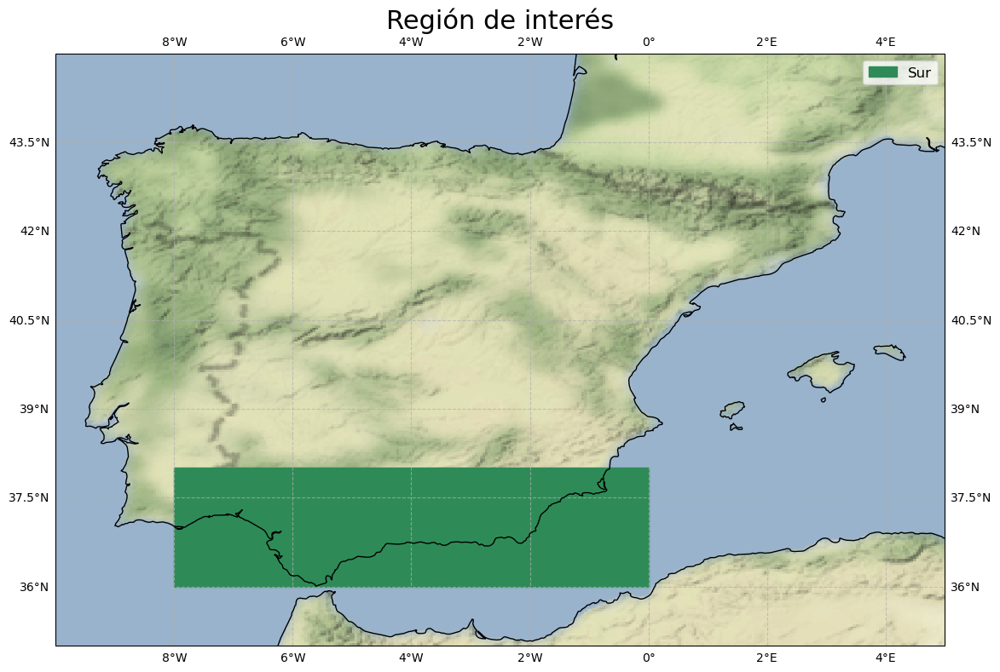

In [8]:
# Vamos a pintar las regiones en un mapa para verlas mejor


plt.style.use('default') # Estilo general
fig, ax = plt.subplots(figsize=(16, 8), ncols=1)
ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
ax.coastlines()

stamen_terrain = cimgt.Stamen('terrain-background')
zoom = 5
ax.add_image(stamen_terrain, zoom)

ax.set_global() # added following an answer to my question

ax.gridlines(draw_labels = True,linestyle='--',alpha=0.7,zorder=1)
def pinta_region(lats,lons,color,ax=ax,label=None): #Codigo de Diego
    lat_corners = np.array([lats[0], lats[0],lats[1], lats[1]])
    lon_corners = np.array([ lons[0], lons[1], lons[1], lons[0]])
    poly_corners = np.zeros((len(lat_corners), 2), np.float64)
    poly_corners[:,0] = lon_corners
    poly_corners[:,1] = lat_corners
    poly = mpatches.Polygon(poly_corners, closed=True, ec=color, fill=True, lw=1, fc=color,label=label)#, transform=ccrs.Geodetic())
    ax.add_patch(poly)

#los,las= np.meshgrid(lon_red,lat_red)
ax.set_title('Región de interés',size=22)
pinta_region([38,36],[-8,0],'seagreen',ax,label='Sur')
ax.legend(prop={'size':12})
ax.set_extent([-10,5,35,45])
#ax.plot(los,las,'k.') #para pintar la malla de puntos de los cuales hay datos
plt.tight_layout()
fig.savefig('Regiones.png',dpi=500,facecolor='w')

In [9]:
path_stations= r"C:\Users\ideapad 5 15ITL05\Desktop\Meteo UCM\1 cuatrimestre\Analisis de datos en meteorologia\Repaso python\Dia 3\isd-history.csv"
stations=pd.read_csv(path_stations)
stations[stations['CTRY']== 'SP']

,USAF,WBAN,STATION NAME,CTRY,STATE,ICAO,LAT,LON,ELEV(M),BEGIN,END
2838,080010,99999,LA CORUNA,SP,NaN,NaN,43.367,-8.417,67.0,19310101,20201004
2839,080020,99999,A CORUNA,SP,NaN,LECO,43.302,-8.377,98.5,19741001,20201004
2840,080030,99999,MONTEVENTOSO,SP,NaN,NaN,43.483,-8.317,240.0,19730101,20050211
2841,080050,99999,EL FERROL,SP,NaN,NaN,43.483,-8.233,9.0,19730101,20051112
2842,080070,99999,CERCEDA,SP,NaN,NaN,43.167,-8.533,595.0,20040517,20060207
...,...,...,...,...,...,...,...,...,...,...,...
12729,600350,99999,FUERTEVENTURA,SP,NaN,GCFV,28.453,-13.864,25.3,19500327,20201004
12730,600400,99999,LANZAROTE,SP,NaN,GCRR,28.945,-13.605,14.3,19500310,20201004
12788,603200,99999,CEUTA,SP,NaN,NaN,35.917,-5.350,88.0,19650101,20201004
12790,603380,99999,MELILLA,SP,NaN,GEML,35.280,-2.956,47.5,19641001,20201004


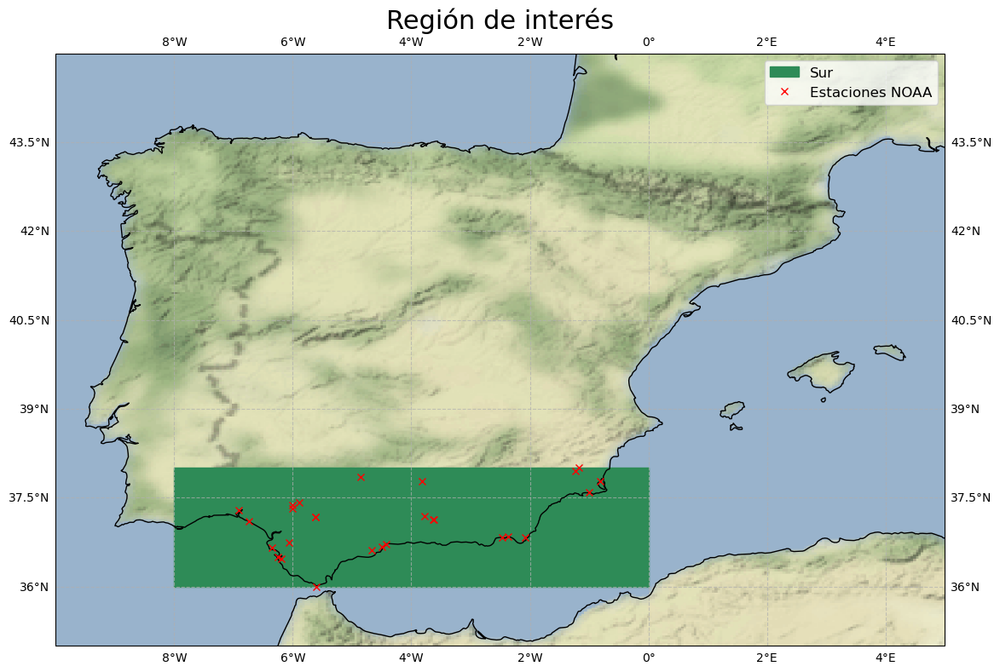

In [10]:
#Veamos aquellas estaciones que están dentrro de la región de estudio
estaciones= stations[(stations['CTRY']== 'SP')&(stations['LAT']>=lat_lims[1])&(stations['LAT']<=lat_lims[0])&(stations['LON']>=lon_lims[0])&(stations['LON']<=lon_lims[1])]
#Pintamos en el mapa anterior estas estaciones de la NOAA
fig, ax = plt.subplots(figsize=(16, 8), ncols=1)
ax=plt.subplot(1,1,1,projection=ccrs.PlateCarree())
ax.coastlines()

stamen_terrain = cimgt.Stamen('terrain-background')
zoom = 5
ax.add_image(stamen_terrain, zoom)

ax.set_global() # added following an answer to my question

ax.gridlines(draw_labels = True,linestyle='--',alpha=0.7,zorder=1)

ax.set_title('Región de interés',size=22)
pinta_region([38,36],[-8,0],'seagreen',ax,label='Sur')

ax.set_extent([-10,5,35,45])
ax.plot(estaciones['LON'],estaciones['LAT'],'rx',label='Estaciones NOAA')
plt.tight_layout()
ax.legend(prop={'size':12})
fig.savefig('Regiones.png',dpi=500,facecolor='w')

In [11]:
#Comparemos los datos de una estación y del punto del set de datos más próximo:
estaciones

,USAF,WBAN,STATION NAME,CTRY,STATE,ICAO,LAT,LON,ELEV(M),BEGIN,END
2849,080144,99999,ARMILLA,SP,NaN,LEGA,37.133,-3.636,700.1,20040525,20201004
2945,083830,99999,HUELVA,SP,NaN,NaN,37.283,-6.917,20.0,19730101,20201004
2946,083840,99999,EL ARENOSILLO,SP,NaN,NaN,37.100,-6.733,41.0,20020430,20070307
2947,083900,99999,SEVILLA/TABLADA,SP,NaN,NaN,37.367,-6.000,14.0,19730101,20051206
2948,083905,99999,SEVILLA HELIPORT,SP,NaN,LEEC,37.317,-6.000,5.0,20070629,20201002
2949,083910,99999,SEVILLA,SP,NaN,LEZL,37.418,-5.893,33.8,19730101,20201004
2950,083970,99999,MORON AB,SP,NaN,LEMO,37.175,-5.616,86.9,19580102,20201004
2951,084100,99999,CORDOBA,SP,NaN,LEBA,37.842,-4.849,90.5,19730101,20201004
2952,084170,99999,JAEN,SP,NaN,NaN,37.783,-3.817,580.0,19730201,20201004
2953,084190,99999,GRANADA,SP,NaN,LEGR,37.189,-3.777,566.9,19730101,20201004


In [12]:
#Next, we build up the code of the station (we now it already from the statement of the exercise)
def readDataFrame(stationName):
    url = r"C:\Users\ideapad 5 15ITL05\Desktop\Meteo UCM\1 cuatrimestre\Analisis de datos en meteorologia\Repaso python\Dia 3\isd-history.csv"
    c=pd.read_csv(url)

    #Seleccionamos los años de inicio y final de lectura
    yearInit = 1975
    yearEnd = 2016

    #Construimos el código que necesitamos para bajar los datos de la estación:
    station=str(c.loc[(c['STATION NAME']==stationName)]['USAF'].values[0]) + '-' + \
            str(c.loc[(c['STATION NAME']==stationName)]['WBAN'].values[0])
    print('Seleccionada la estacion ' + stationName + ' con código ' + station)

    #Definimos las columnas y el tipo de dato que va a tener el DataFrame donde vamos a alojar los datos de la estación
    colNames=['year','month','day','hour','temp','tempd','slp','windDir','windSpeed','cloud','pcp1h','pcp6h']
    dataType=['int','int','int','int','float','float','int','int','int','int','int','int',]

    #Definimos los límites de los caractéres donde están los datos en los archivos que vamos a leer 
    #(Esta información está en: https://www.ncei.noaa.gov/pub/data/noaa/isd-lite/isd-lite-format.txt)
    limits=[(0,4),(5,7),(8,10),(11,13),(14,19),(20,25),(26,31),(32,37),(38,43),(44,49),(50,55),(56,61)]
    
    #Lectura de los datos:
    isd_data=pd.DataFrame(columns=colNames)
    for iyr in range(yearInit, yearEnd, 1):
        fil='https://www.ncei.noaa.gov/pub/data/noaa/isd-lite/'+str(iyr)+'/'+station+'-'+ str(iyr)+'.gz'
        data= pd.read_fwf(fil,sep=' ',compression='gzip',head=0,
                     names=colNames,colspecs=limits)
        isd_data = pd.concat([isd_data,data])
        
    #Cambio el tipo de dato (porque los lee como objetos str y queremos que sean numéricos)
    dictType={ colNames[i] : dataType[i] for i in range(12)}
    data = isd_data.astype(dictType,copy=True)
    #Los datos missing son -9999 en la base de datos: cambiamos por NaN:
    data = data.replace(-9999,np.NaN)
    dataDailymax = data.groupby(['year','month','day']).max().drop(['hour'],axis=1).reset_index()
    dataDailymin = data.groupby(['year','month','day']).mean().drop(['hour'],axis=1).reset_index()
    dataDaily = data.groupby(['year','month','day']).mean().drop(['hour'],axis=1).reset_index()
    
    dataMonthly = data.groupby(['year','month']).mean().drop(['day'],axis=1).reset_index()
    dataYearly = data.groupby(['year']).mean().drop(['month'],axis=1).reset_index()

    
    
    return dataDailymax,dataDailymin,dataDaily, dataMonthly, dataYearly

Una vez hemos visualizado la región de estudio y hemos visto las estaciones meteorológicas con las que cuenta, procedemos a hacer la definición de los dos índices de extremos que vamos a analizar:
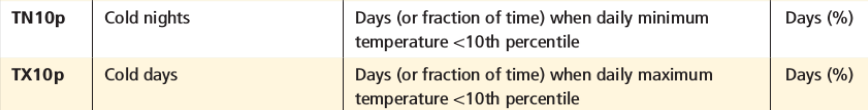

In [13]:
#Vamos a representar la temperatura equivalente al percentil 10 en la región de estudio.
cuantil1= np.quantile(min_data_red_1.tn,0.1,axis=0)
cuantil2= np.quantile(min_data_red_2.tn,0.1,axis=0)

In [14]:
cuantil1

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [15]:
#plt.contourf(lon,lat,cuantil1)
minimo= np.min((np.min((np.ma.masked_array(cuantil1, np.isnan(cuantil1)))),np.min((np.ma.masked_array(cuantil2, np.isnan(cuantil2))))))
maximo= np.max((np.max((np.ma.masked_array(cuantil1, np.isnan(cuantil1)))),np.max((np.ma.masked_array(cuantil2, np.isnan(cuantil2))))))

In [16]:
np.round(2.6)

3.0

C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:487: UserWarning: The .ylabels_right attribute is deprecated. Please use .right_labels to toggle visibility instead.
  warnings.warn('The .ylabels_right attribute is deprecated. Please '
C:\Anaconda\envs\analisisdatosucm\lib\site-packages\cartopy\mpl\gridliner.py:451: UserWarning: The .xlabels_top attribute is deprecated. Please use .top_labels to toggle visibility instead.
  warnings.warn('The .xlabels_top attribute is deprecated. Please '


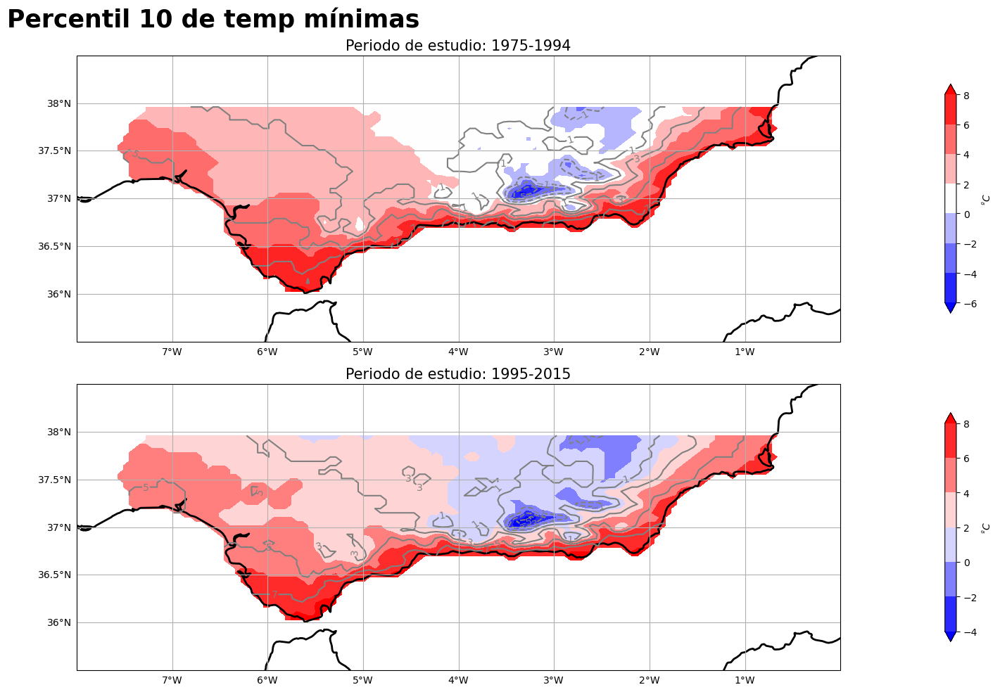

In [17]:
def DibujoMapados(lon,lat,var1,var2,mapbar,unidades,subtitulo1,subtitulo2,figura):
    fig = plt.figure(figsize=(30,10), tight_layout=True) 
    ax1 = fig.add_subplot(211, projection=ccrs.PlateCarree())
    ax2 = fig.add_subplot(212, projection=ccrs.PlateCarree())
    fig.suptitle('Percentil 10 de temp mínimas',fontsize=25, weight='bold')
    
    minimo= np.min((np.min((np.ma.masked_array(var1, np.isnan(var1)))),np.min((np.ma.masked_array(var2, np.isnan(var2))))))
    maximo= 1.01* np.max((np.max((np.ma.masked_array(var1, np.isnan(var1)))),np.max((np.ma.masked_array(var2, np.isnan(var2))))))
    levels=np.arange(np.round(minimo),np.round(maximo),2)
     
    im=ax1.contourf(lon,lat,var1, cmap = mapbar, extend='both')
    ax1.coastlines(linewidth = 2)
    gl=ax1.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im,ax=ax1,shrink=0.8, label = unidades,orientation='vertical')
    im2=ax1.contour(lon,lat,var1,levels, colors='gray')
    ax1.clabel(im2, im2.levels, inline=True, fontsize=10)
    ax1.set_extent([-8,0,35.5,38.5])
    ax1.set_title(subtitulo1,fontsize=15)
    
    im3=ax2.contourf(lon,lat,var2, cmap = mapbar, extend='both')
    ax2.coastlines(linewidth = 2)
    gl=ax2.gridlines(draw_labels = True)
    gl.ylabels_right = False
    gl.xlabels_top = False
    fig.colorbar(im3,ax=ax2,shrink=0.8, label = unidades,orientation='vertical')
    im4=ax2.contour(lon,lat,var2,levels, colors='gray')
    ax2.clabel(im4, im4.levels, inline=True, fontsize=10)
    ax2.set_extent([-8,0,35.5,38.5])
    ax2.set_title(subtitulo2,fontsize=15)
    fig.savefig(figura)


lat= min_data_red_1.lat
lon= min_data_red_1.lon



mapbar='bwr'
subtitulo1='Periodo de estudio: 1975-1994'
subtitulo2='Periodo de estudio: 1995-2015'
unidades='$^{º}C$'
figura='Percentil 10 de temp mínimas.png'
DibujoMapados(lon,lat,cuantil1,cuantil2,mapbar,unidades,subtitulo1,subtitulo2,figura)


In [18]:
#Definimos el periodo para determinar los cuantiles como el 1975-1994
#Buscamos el porcentaje de días que la temp es inferior a dicho cuantil
cuantil= cuantil1
num_cold1= np.sum(np.where(min_data_red_1.tn<cuantil,1,0),axis=0)
num_cold2= np.sum(np.where(min_data_red_2.tn<cuantil,1,0),axis=0)
n= min_data_red_1.tn.shape[0]
por1= num_cold1*100/n
por2= num_cold2*100/n
mini= np.min((np.min(por1),np.min(por2)))
maxi= np.max((np.max(por1),np.max(por2)))

Text(0.5, 0.98, 'Porcentaje de noches frías definiendo el percentil con el primer periodo')

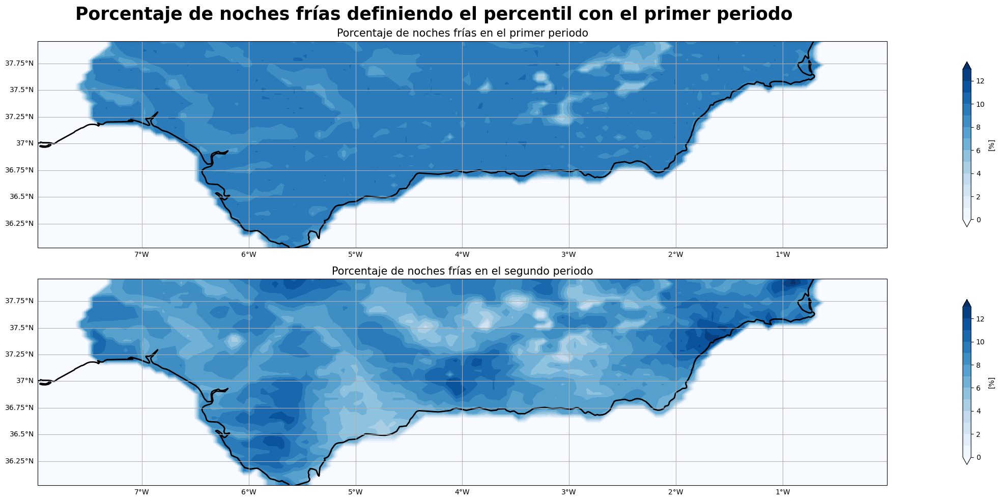

In [19]:
#Representamos el porcentaje para cada punto de la malla de datos
fig = plt.figure(figsize=(30,10), tight_layout=True) 
ax1 = fig.add_subplot(211, projection=ccrs.PlateCarree())
ax2 = fig.add_subplot(212, projection=ccrs.PlateCarree())
cbarticks = np.arange(mini,maxi,1)

ax1.coastlines(linewidth = 2)
gl=ax1.gridlines(draw_labels = True)
gl.ylabels_right = False
gl.xlabels_top = False
ax2.coastlines(linewidth = 2)
gl=ax2.gridlines(draw_labels = True)
gl.ylabels_right = False
gl.xlabels_top = False

 
cmap= 'Blues'
unidades= '[%]'
#im=ax1.contourf(lon,lat,por1, cbarticks,cmap = cmap, extend='both', vmin = mini, vmax = maxi)
im=ax1.contourf(lon,lat,por1,cbarticks,cmap = cmap, extend='both', vmin = mini, vmax = maxi)

im2=ax2.contourf(lon,lat,por2, cbarticks,cmap = cmap, extend='both', vmin = mini, vmax = maxi)
fig.colorbar(im,ax=ax1,shrink=0.8, label=unidades,orientation='vertical')
fig.colorbar(im2,ax=ax2,shrink=0.8, label=unidades,orientation='vertical')
ax1.set_title('Porcentaje de noches frías en el primer periodo',fontsize=15)
ax2.set_title('Porcentaje de noches frías en el segundo periodo',fontsize=15)
fig.suptitle('Porcentaje de noches frías definiendo el percentil con el primer periodo',fontsize=25, weight='bold')


Text(0.5, 0.98, 'Porcentaje de noches frías definiendo el percentil con el segundo periodo')

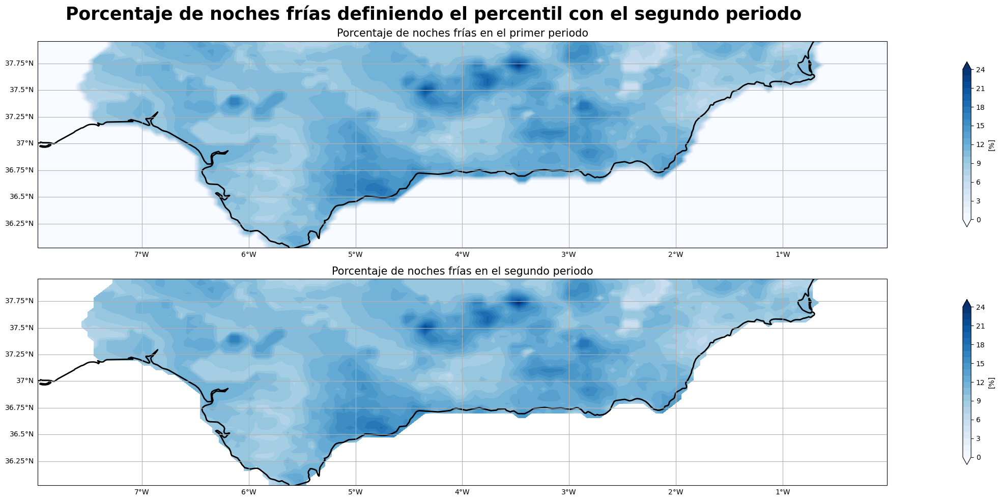

In [20]:
cuantil= cuantil2
num_cold1= np.sum(np.where(min_data_red_1.tn<cuantil,1,0),axis=0)
num_cold2= np.sum(np.where(min_data_red_2.tn<cuantil,1,0),axis=0)
n= min_data_red_1.tn.shape[0]
por1= num_cold1*100/n
por2= num_cold2*100/n
mini= np.min((np.min(por1),np.min(por2)))
maxi= np.max((np.max(por1),np.max(por2)))

fig = plt.figure(figsize=(30,10), tight_layout=True) 
ax1 = fig.add_subplot(211, projection=ccrs.PlateCarree())
ax2 = fig.add_subplot(212, projection=ccrs.PlateCarree())
cbarticks = np.arange(mini,maxi,1)

ax1.coastlines(linewidth = 2)
gl=ax1.gridlines(draw_labels = True)
gl.ylabels_right = False
gl.xlabels_top = False
ax2.coastlines(linewidth = 2)
gl=ax2.gridlines(draw_labels = True)
gl.ylabels_right = False
gl.xlabels_top = False

 
cmap= 'Blues'
unidades= '[%]'
#im=ax1.contourf(lon,lat,por1, cbarticks,cmap = cmap, extend='both', vmin = mini, vmax = maxi)
im=ax1.contourf(lon,lat,por1,cbarticks,cmap = cmap, extend='both', vmin = mini, vmax = maxi)

#im2=ax2.contourf(lon,lat,por2, cbarticks,cmap = cmap, extend='both', vmin = mini, vmax = maxi)
im2=ax2.contourf(lon,lat,(np.where(np.isnan(min_data_red_1.tn),np.nan,por1).mean(axis=0)), cbarticks,cmap = cmap, extend='both', vmin = mini, vmax = maxi)
fig.colorbar(im,ax=ax1,shrink=0.8, label=unidades,orientation='vertical')
fig.colorbar(im2,ax=ax2,shrink=0.8, label=unidades,orientation='vertical')
ax1.set_title('Porcentaje de noches frías en el primer periodo',fontsize=15)
ax2.set_title('Porcentaje de noches frías en el segundo periodo',fontsize=15)
fig.suptitle('Porcentaje de noches frías definiendo el percentil con el segundo periodo',fontsize=25, weight='bold')

### Invierno

In [21]:
#max_data_red= max_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]),Time=slice('1975','2015'))
invierno1= min_data_red_1.tn[min_data_red_1['Time.season']=='DJF',:,:].squeeze()
invierno2= min_data_red_2.tn[min_data_red_2['Time.season']=='DJF',:,:].squeeze()
#Calculamos el cuantil con todo el periodo
alldata_inv= min_data_red.tn[min_data_red['Time.season']=='DJF',:,:].squeeze()
cuantil_inv= np.quantile(alldata_inv,0.1,axis=0)
cuantil_inv.shape

(44, 137)

In [22]:
invierno1['Time.year']
n_cold_days_inv_1= np.zeros(20)
n_cold_days_inv_2= np.zeros(21)
#num_cold1_inv= np.sum(np.where(min_data_red_1.tn<cuantil,1,0),axis=0)
#n= min_data_red_1.tn.shape[0]
#por1= num_cold1*100/n

s=0
for i in range(1975,1995):
    a= np.sum(np.where(invierno1[invierno1['Time.year']==i]<cuantil_inv,1,0),axis=0)
    n_cold_days_inv_1[s]= np.nanmean(np.where(np.isnan(invierno1[invierno1['Time.year']==i]),np.nan,a)) #esto lo tenemos que hacer porque si no al hacer la media toma los nan como 0
    s+=1
l=0    
for i in range(1995,2016):
    a= np.sum(np.where(invierno2[invierno2['Time.year']==i]<cuantil_inv,1,0),axis=0)
    n_cold_days_inv_2[l]= np.nanmean(np.where(np.isnan(invierno2[invierno2['Time.year']==i]),np.nan,a))
    l+=1 
    
n_days_inv= invierno1[invierno1['Time.year']==1975,:,:].shape[0]
perc_cold_days_1= (n_cold_days_inv_1/n_days_inv)*100
perc_cold_days_2= (n_cold_days_inv_2/n_days_inv)*100

Text(0.5, 0.98, 'Porcentaje de noches frías en invierno definiendo el percentil el periodo completo')

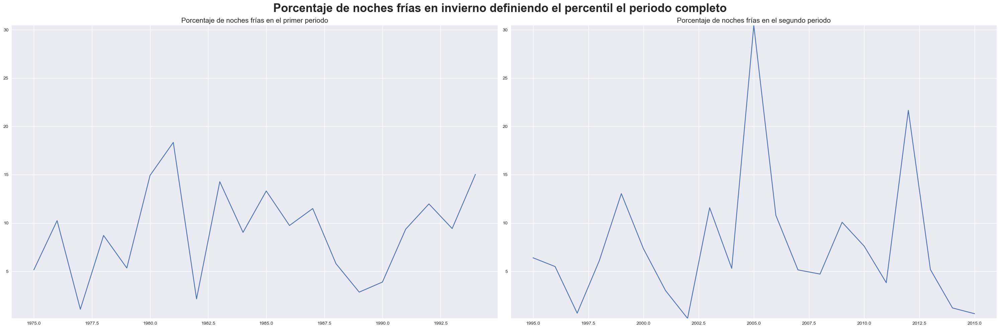

In [24]:
plt.style.use('seaborn')
fig = plt.figure(figsize=(30,10), tight_layout=True) 
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

period1= np.arange(1975,1995,1)
period2= np.arange(1995,2016,1)
ax1.plot(period1,perc_cold_days_1)

ax2.plot(period2,perc_cold_days_2)
maximo= np.max((np.max(perc_cold_days_1),np.max(perc_cold_days_2)))
minimo= np.min((np.min(perc_cold_days_1),np.min(perc_cold_days_2)))
ax1.set_ylim(minimo,maximo)
ax2.set_ylim(minimo,maximo)
ax1.set_title('Porcentaje de noches frías en el primer periodo',fontsize=15)
ax2.set_title('Porcentaje de noches frías en el segundo periodo',fontsize=15)
fig.suptitle('Porcentaje de noches frías en invierno definiendo el percentil el periodo completo',fontsize=25, weight='bold')

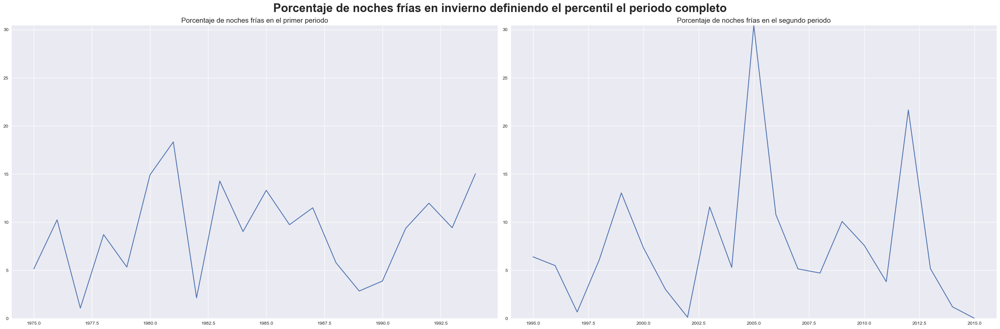

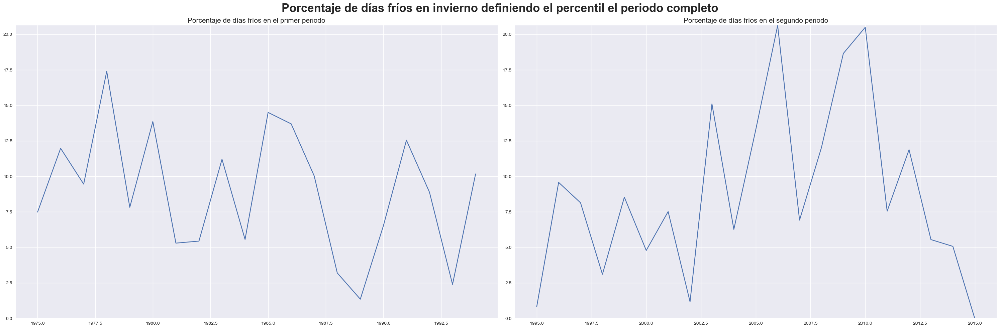

In [25]:
def cold_days_percentage(allperiod,period1, period2, season,subtitle1,subtitle2,title,cold_nights=True):
    if cold_nights==True:
        invierno1= period1.tn[period1['Time.season']==season,:,:].squeeze()
        invierno2= period2.tn[period2['Time.season']==season,:,:].squeeze()
        alldata_inv= allperiod.tn[allperiod['Time.season']==season,:,:].squeeze()
    else:   
        invierno1= period1.tx[period1['Time.season']==season,:,:].squeeze()
        invierno2= period2.tx[period2['Time.season']==season,:,:].squeeze()
        alldata_inv= allperiod.tx[allperiod['Time.season']==season,:,:].squeeze()
        
    cuantil_inv= np.quantile(alldata_inv,0.1,axis=0)
    n_cold_days_inv_1= np.zeros(20)
    n_cold_days_inv_2= np.zeros(21)


    s=0
    for i in range(1975,1995):
        a= np.sum(np.where(invierno1[invierno1['Time.year']==i]<cuantil_inv,1,0),axis=0)
        n_cold_days_inv_1[s]= np.nanmean(np.where(np.isnan(invierno1[invierno1['Time.year']==i]),np.nan,a)) #esto lo tenemos que hacer porque si no al hacer la media toma los nan como 0
        s+=1
    l=0    
    for i in range(1995,2015):
        a= np.sum(np.where(invierno2[invierno2['Time.year']==i]<cuantil_inv,1,0),axis=0)
        n_cold_days_inv_2[l]= np.nanmean(np.where(np.isnan(invierno2[invierno2['Time.year']==i]),np.nan,a))
        l+=1 

    n_days_inv= invierno1[invierno1['Time.year']==1975,:,:].shape[0]
    perc_cold_days_1= (n_cold_days_inv_1/n_days_inv)*100
    perc_cold_days_2= (n_cold_days_inv_2/n_days_inv)*100
    plt.style.use('seaborn')
    fig = plt.figure(figsize=(30,10), tight_layout=True) 
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    period1= np.arange(1975,1995,1)
    period2= np.arange(1995,2016,1)
    ax1.plot(period1,perc_cold_days_1)
    ax2.plot(period2,perc_cold_days_2)
    maximo= np.max((np.max(perc_cold_days_1),np.max(perc_cold_days_2)))
    minimo= np.min((np.min(perc_cold_days_1),np.min(perc_cold_days_2)))
    ax1.set_ylim(minimo,maximo)
    ax2.set_ylim(minimo,maximo)
    ax1.set_title(subtitle1,fontsize=15)
    ax2.set_title(subtitle2,fontsize=15)
    fig.suptitle(title,fontsize=25, weight='bold')

subtitle1= 'Porcentaje de noches frías en el primer periodo'
subtitle2= 'Porcentaje de noches frías en el segundo periodo'
title= 'Porcentaje de noches frías en invierno definiendo el percentil el periodo completo'
subtitle12= 'Porcentaje de días fríos en el primer periodo'
subtitle22= 'Porcentaje de días fríos en el segundo periodo'
title2= 'Porcentaje de días fríos en invierno definiendo el percentil el periodo completo' 

cold_days_percentage(min_data_red, min_data_red_1, min_data_red_2,'DJF',subtitle1,subtitle2,title)
cold_days_percentage(max_data_red, max_data_red_1, max_data_red_2,'DJF',subtitle12,subtitle22,title2,cold_nights=False)

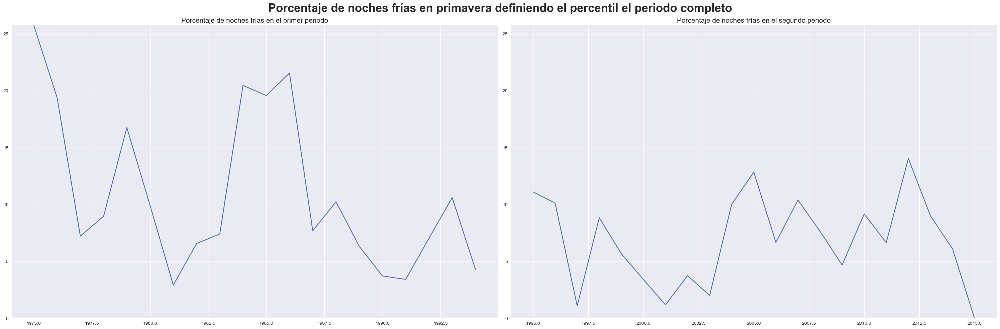

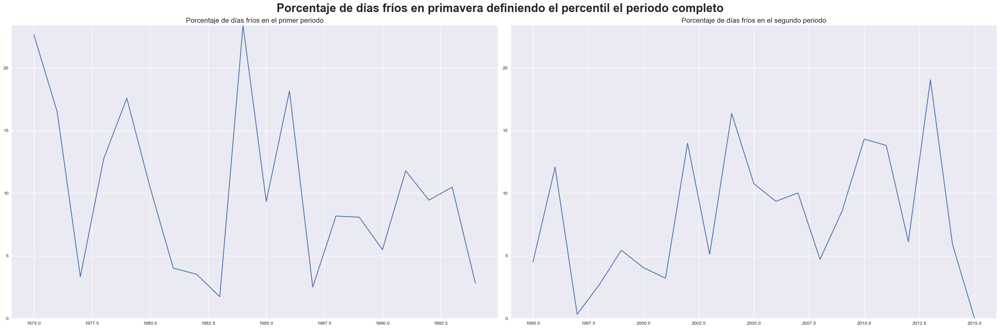

In [26]:
title= 'Porcentaje de noches frías en primavera definiendo el percentil el periodo completo'
title2= 'Porcentaje de días fríos en primavera definiendo el percentil el periodo completo'

cold_days_percentage(min_data_red, min_data_red_1, min_data_red_2,'MAM',subtitle1,subtitle2,title)
cold_days_percentage(max_data_red, max_data_red_1, max_data_red_2,'MAM',subtitle12,subtitle22,title2,cold_nights=False)

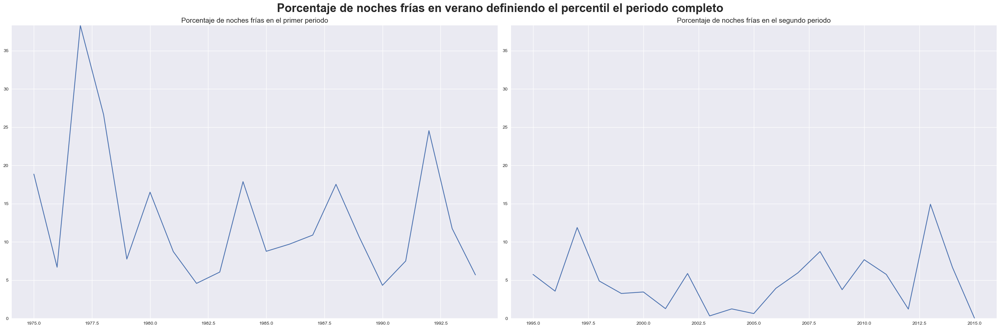

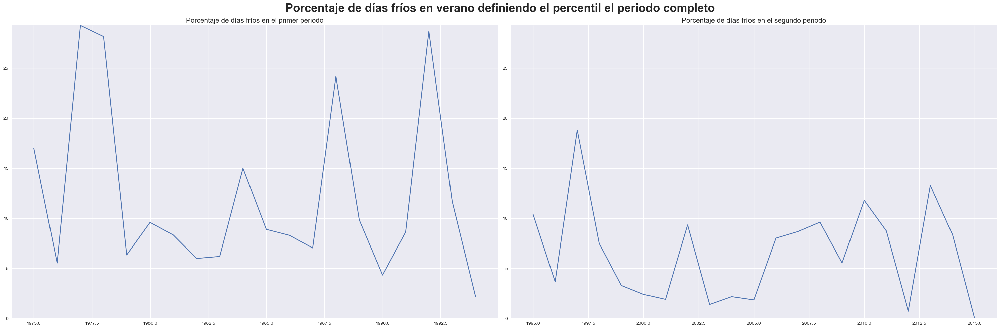

In [27]:
title= 'Porcentaje de noches frías en verano definiendo el percentil el periodo completo'
title2= 'Porcentaje de días fríos en verano definiendo el percentil el periodo completo'

cold_days_percentage(min_data_red, min_data_red_1, min_data_red_2,'JJA',subtitle1,subtitle2,title)
cold_days_percentage(max_data_red, max_data_red_1, max_data_red_2,'JJA',subtitle12,subtitle22,title2,cold_nights=False)


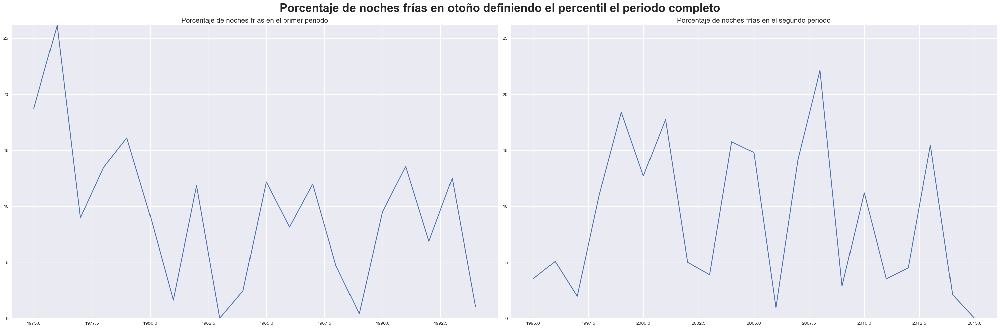

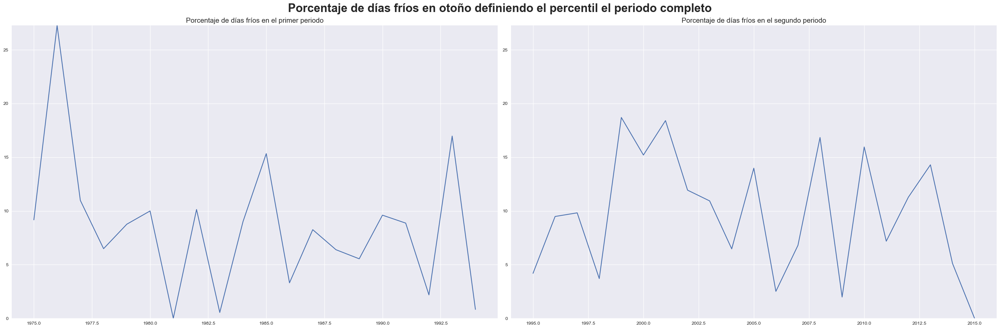

In [28]:
title= 'Porcentaje de noches frías en otoño definiendo el percentil el periodo completo'
title2= 'Porcentaje de días fríos en otoño definiendo el percentil el periodo completo'

cold_days_percentage(min_data_red, min_data_red_1, min_data_red_2,'SON',subtitle1,subtitle2,title)
cold_days_percentage(max_data_red, max_data_red_1, max_data_red_2,'SON',subtitle12,subtitle22,title2,cold_nights=False)

# Comparación con estación NOAA
A continuacón, procedemos a comparar los resultados obtenidos con una de las estaciones de la NOAA presentes en la región, concretamente, tomaremos los datos de la estación de Granada

In [29]:
station_name='GRANADA'
(maximas,minimas,daily,monthly,yearly)= readDataFrame(station_name)

Seleccionada la estacion GRANADA con código 084190-99999


In [30]:
maximas

,year,month,day,temp,tempd,slp,windDir,windSpeed,cloud,pcp1h,pcp6h
0,1975,1,1,170.0,80.0,10351.0,180.0,41.0,0.0,NaN,NaN
1,1975,1,2,160.0,0.0,10347.0,0.0,0.0,0.0,NaN,NaN
2,1975,1,3,150.0,30.0,10331.0,170.0,41.0,0.0,NaN,NaN
3,1975,1,4,140.0,30.0,10325.0,180.0,51.0,2.0,NaN,NaN
4,1975,1,5,140.0,20.0,10360.0,180.0,21.0,1.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
14966,2015,12,27,185.0,54.0,10330.0,270.0,62.0,6.0,NaN,0.0
14967,2015,12,28,181.0,39.0,10318.0,310.0,36.0,8.0,NaN,0.0
14968,2015,12,29,166.0,113.0,10349.0,360.0,41.0,8.0,NaN,6.0
14969,2015,12,30,166.0,71.0,10349.0,360.0,67.0,9.0,NaN,0.0


In [31]:
#Como necesitamos que los datos estén en el mismo formato, los dividiremos de la misma manera que los de la base de datos STEAD

scaling_factor_temp= 10
maximas = maximas.replace(-9999,np.NaN)
minimas = minimas.replace(-9999,np.NaN)

maximas['temp'] = maximas["temp"].apply(lambda x: x/scaling_factor_temp)
minimas['temp'] = minimas["temp"].apply(lambda x: x/scaling_factor_temp)

maxima_gran_1= maximas[['year','month','day','temp']][maximas['year']<1995]
maxima_gran_2= maximas[['year','month','day','temp']][maximas['year']>1994]

minima_gran_1= minimas[['year','month','day','temp']][minimas['year']<1995]
minima_gran_2= minimas[['year','month','day','temp']][minimas['year']>1994]

In [32]:
invierno1= minima_gran_1[['year','temp']][(minima_gran_1['month']<3)|(minima_gran_1['month']==12)].squeeze()
invierno2= minima_gran_2[['year','temp']][(minima_gran_2['month']<3)|(minima_gran_2['month']==12)].squeeze()

invierno12= maxima_gran_1[['year','temp']][(maxima_gran_1['month']<3)|(maxima_gran_1['month']==12)].squeeze()
invierno22= maxima_gran_2[['year','temp']][(maxima_gran_2['month']<3)|(maxima_gran_2['month']==12)].squeeze()
#Calculamos el cuantil con todo el periodo
alldata_inv= minimas[['year','temp']][(minimas['month']<3)|(minimas['month']==12)].squeeze()
cuantil_inv= np.quantile(alldata_inv['temp'],0.1)
alldata_inv2= maximas[['year','temp']][(maximas['month']<3)|(maximas['month']==12)].squeeze()
cuantil_inv2= np.quantile(alldata_inv2['temp'],0.1)

n_cold_days_inv_1= np.zeros(20)
n_cold_days_inv_2= np.zeros(21)

n_cold_nights_inv_1= np.zeros(20)
n_cold_nights_inv_2= np.zeros(21)

s=0
for i in range(1975,1995):
    n_cold_nights_inv_1[s]= np.sum(np.where(invierno1['temp'][invierno1['year']==i]<cuantil_inv,1,0),axis=0)
    n_cold_days_inv_1[s]= np.sum(np.where(invierno12['temp'][invierno12['year']==i]<cuantil_inv2,1,0),axis=0)
    s+=1

l=0    
for i in range(1995,2016):
    n_cold_nights_inv_2[l]= np.sum(np.where(invierno2['temp'][invierno2['year']==i]<cuantil_inv,1,0),axis=0)
    n_cold_days_inv_2[l]= np.sum(np.where(invierno22['temp'][invierno22['year']==i]<cuantil_inv2,1,0),axis=0)
    l+=1
    
n_days_inv= invierno1['temp'][invierno1['year']==1975].shape[0]
perc_cold_days_1_gran= (n_cold_days_inv_1/n_days_inv)*100
perc_cold_days_2_gran= (n_cold_days_inv_2/n_days_inv)*100
perc_cold_nights_1_gran= (n_cold_nights_inv_1/n_days_inv)*100
perc_cold_nights_2_gran= (n_cold_nights_inv_2/n_days_inv)*100

Text(0.5, 0.98, 'Porcentaje de días fríos en Granada en invierno definiendo el percentil el periodo completo')

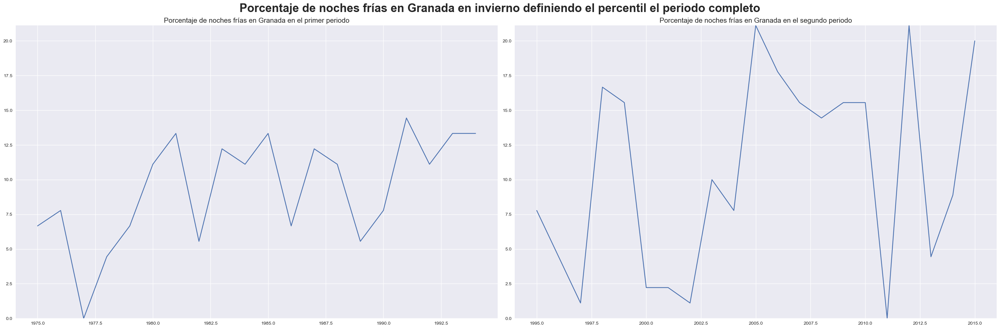

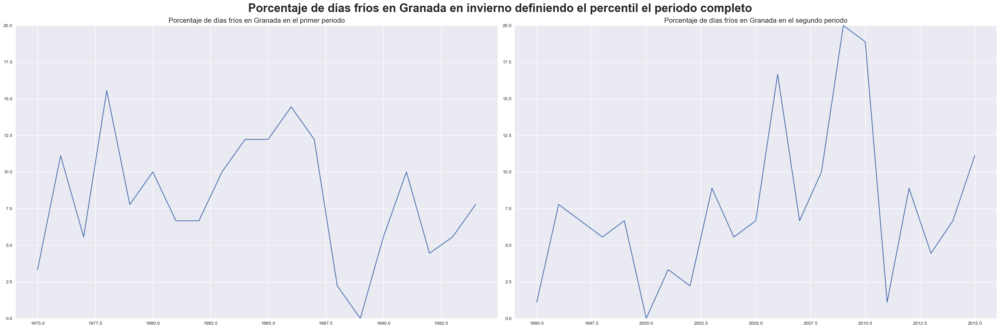

In [33]:
fig = plt.figure(figsize=(30,10), tight_layout=True) 
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

period1= np.arange(1975,1995,1)
period2= np.arange(1995,2016,1)
ax1.plot(period1,perc_cold_nights_1_gran)
ax2.plot(period2,perc_cold_nights_2_gran)
maximo= np.max((np.max(perc_cold_nights_1_gran),np.max(perc_cold_nights_2_gran)))
minimo= np.min((np.min(perc_cold_nights_1_gran),np.min(perc_cold_nights_2_gran)))
ax1.set_ylim(minimo,maximo)
ax2.set_ylim(minimo,maximo)
ax1.set_title('Porcentaje de noches frías en Granada en el primer periodo',fontsize=15)
ax2.set_title('Porcentaje de noches frías en Granada en el segundo periodo',fontsize=15)
fig.suptitle('Porcentaje de noches frías en Granada en invierno definiendo el percentil el periodo completo',fontsize=25, weight='bold')

fig = plt.figure(figsize=(30,10), tight_layout=True) 
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

period1= np.arange(1975,1995,1)
period2= np.arange(1995,2016,1)
ax1.plot(period1,perc_cold_days_1_gran)
ax2.plot(period2,perc_cold_days_2_gran)
maximo= np.max((np.max(perc_cold_days_1_gran),np.max(perc_cold_days_2_gran)))
minimo= np.min((np.min(perc_cold_days_1_gran),np.min(perc_cold_days_2_gran)))
ax1.set_ylim(minimo,maximo)
ax2.set_ylim(minimo,maximo)
ax1.set_title('Porcentaje de días fríos en Granada en el primer periodo',fontsize=15)
ax2.set_title('Porcentaje de días fríos en Granada en el segundo periodo',fontsize=15)
fig.suptitle('Porcentaje de días fríos en Granada en invierno definiendo el percentil el periodo completo',fontsize=25, weight='bold')

# Ejercicio 2

En esta segunda parte, vamos a analizar el periodo de retorno de la señal, para ello, utilizaremos los índices definidos en el apartado anterior pero, en vez de usar las estaciones (seasons) y dividir el periodo en 2, para facilitar el análisis, usaremos una única serie temporal que incluirá todo los datos. De hecho, usaremos datos desde 1901 y definimos el cuantil tomando el periodo entre 1961 y 1990.

In [34]:
path= r"C:\Users\ideapad 5 15ITL05\Desktop\percent_cold_nights_S.nc"
diego= ((xr.open_dataarray(path)).mean(axis=1)).mean(axis=1)
diego

<xarray.DataArray (time: 114)>
array([5.326331  , 6.04057776, 3.17322813, 2.09660852, 4.20598849,
       5.38073465, 6.39049731, 2.84876058, 6.49662306, 2.83376208,
       6.84036142, 5.21811455, 3.44056503, 5.65702521, 6.18629046,
       3.65140759, 9.08163729, 6.22351401, 5.80187436, 2.57369718,
       3.76162384, 4.67653235, 7.18687222, 4.22857714, 8.75671524,
       3.72899074, 3.88965649, 3.62568289, 5.68215906, 6.08298261,
       7.51311233, 9.00828099, 6.80413777, 7.43743807, 5.29601585,
       3.72630919, 2.28945287, 3.57246094, 5.0764469 , 6.73419022,
       6.66078847, 4.32038614, 2.95261383, 9.11213424, 6.18170001,
       5.79837471, 2.43162047, 1.97984747, 2.24141222, 1.96603067,
       4.6333094 , 5.3947787 , 5.41909445, 6.69337612, 2.02475207,
       9.8821936 , 5.03531465, 4.27848124, 1.41363136, 2.92966158,
       1.42026706, 2.62869168, 2.81921808, 2.17710047, 3.80198344,
       3.28498968, 2.65759788, 2.61719283, 4.23262219, 5.87804856,
       6.50453137, 7.53415568, 6.79995637, 8.41724918, 7.09888102,
       6.88822027, 9.27170919, 6.11329776, 4.13690449, 6.12688731,
       5.16775595, 3.48628773, 4.31461399, 8.44488278, 4.7043023 ,
       5.1806183 , 3.48574233, 3.05401278, 1.40445046, 1.92144422,
       5.3287853 , 6.65783422, 6.92608012, 4.63162775, 3.12355128,
       4.12831444, 1.74073502, 3.48265173, 3.77462254, 3.33312123,
       2.81490033, 1.91294507, 2.13615002, 3.87602149, 7.34658352,
       2.60487588, 2.98542873, 3.78030379, 1.98939197, 3.14295843,
       1.37608966, 5.0650844 , 4.57281545, 1.18683586])
Coordinates:
    percentiles  int32 ...
  * time         (time) datetime64[ns] 1901-01-01 1902-01-01 ... 2014-01-01

In [87]:
alldata_min

<xarray.DataArray 'tn' (Time: 41638, lat: 44, lon: 137)>
[250993864 values with dtype=float32]
Coordinates:
  * lon      (lon) float64 -7.976 -7.918 -7.859 ... -0.1371 -0.07858 -0.02008
  * lat      (lat) float64 37.96 37.91 37.87 37.82 ... 36.16 36.11 36.07 36.02
  * Time     (Time) datetime64[ns] 1901-01-02 1901-01-03 ... 2015-01-01
Attributes:
    units:      Celsius degrees
    long_name:  Minimum temperature

a
b


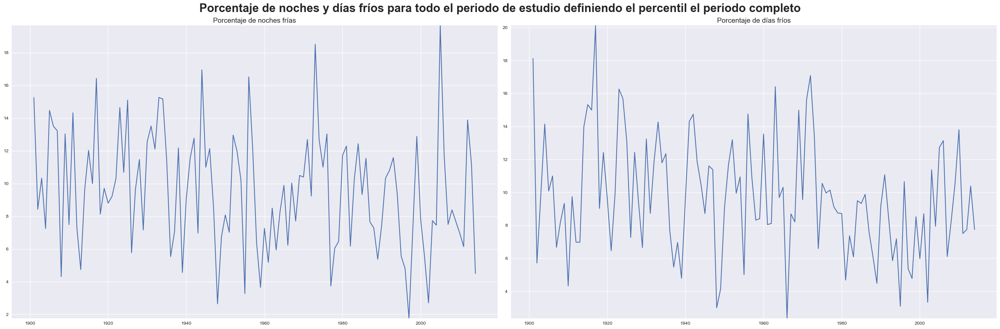

In [108]:
#diego= correct_series(xr.open_dataarray(min_data))
max_data_red= max_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]))
min_data_red= min_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]))

max_data_red_percentil= max_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]),Time=slice('1961','1990'))
min_data_red_percentil= min_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]),Time=slice('1961','1990'))

alldata_min= min_data_red.tn
alldata_max= max_data_red.tx

cuantil_min= np.quantile(min_data_red_percentil.tn,0.1,axis=0)
cuantil_max= np.quantile(max_data_red_percentil.tx,0.1,axis=0)

n_cold_nights= np.zeros(114)
#t_mean_cold_nights= np.zeros(114)
n_cold_days= np.zeros(114)
#t_mean_cold_days= np.zeros(114)

print('a')
s=0
for i in range(1901,2015):
    a= np.sum(np.where(alldata_min[alldata_min['Time.year']==i]<cuantil_min,1,0),axis=0)
    #aa= np.sum(np.where(alldata_min[alldata_min['Time.year']==i]<cuantil_min,alldata_min[alldata_min['Time.year']==i],0),axis=0)/365
    n_cold_nights[s]= np.nanmean(np.where(np.isnan(alldata_min[alldata_min['Time.year']==i]),np.nan,a))
    #t_mean_cold_nights[s]= np.nanmean(np.where(np.isnan(alldata_min[alldata_min['Time.year']==i]),np.nan,aa))
    
    b= np.sum(np.where(alldata_max[alldata_max['Time.year']==i]<cuantil_max,1,0),axis=0)   
    #bb= np.sum(np.where(alldata_max[alldata_max['Time.year']==i]<cuantil_max,alldata_max[alldata_max['Time.year']==i],0),axis=0)/365
    n_cold_days[s]= np.nanmean(np.where(np.isnan(alldata_max[alldata_max['Time.year']==i]),np.nan,b))
    #t_mean_cold_days[s]= np.nanmean(np.where(np.isnan(alldata_max[alldata_max['Time.year']==i]),np.nan,bb))

    #n_cold_nights[s]= np.mean(np.sum(np.where(alldata_min[alldata_min['Time.year']==i]<cuantil_min,1,0),axis=0))
    #n_cold_days[s]= np.mean(np.sum(np.where(alldata_max[alldata_max['Time.year']==i]<cuantil_max,1,0),axis=0))
    s+=1
    
print('b')
n_days_year= 365
perc_cold_nights= (n_cold_nights/n_days_year)*100
perc_cold_days= (n_cold_days/n_days_year)*100

fig = plt.figure(figsize=(30,10), tight_layout=True) 
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

period= np.arange(1901,2015,1)

ax1.plot(period,perc_cold_nights)
#ax1.plot(period,diego,'r')
ax2.plot(period,perc_cold_days)
maximo_night= np.max(perc_cold_nights)
minimo_night= np.min(perc_cold_nights)
maximo_day= np.max(perc_cold_days)
minimo_day= np.min(perc_cold_days)

ax1.set_ylim(minimo_night,maximo_night)
ax2.set_ylim(minimo_day,maximo_day)
ax1.set_title('Porcentaje de noches frías',fontsize=15)
ax2.set_title('Porcentaje de días fríos',fontsize=15)
fig.suptitle('Porcentaje de noches y días fríos para todo el periodo de estudio definiendo el percentil el periodo completo',fontsize=25, weight='bold')
fig.savefig('Porcentaje de noches y días fríos para todo el periodo de estudio definiendo el percentil el periodo completo.png')

C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_3884\2298658326.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(perc_cold_nights, ax=ax1)
C:\Users\ideapad 5 15ITL05\AppData\Local\Temp\ipykernel_3884\2298658326.py:6: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(perc_cold_days, ax=ax2

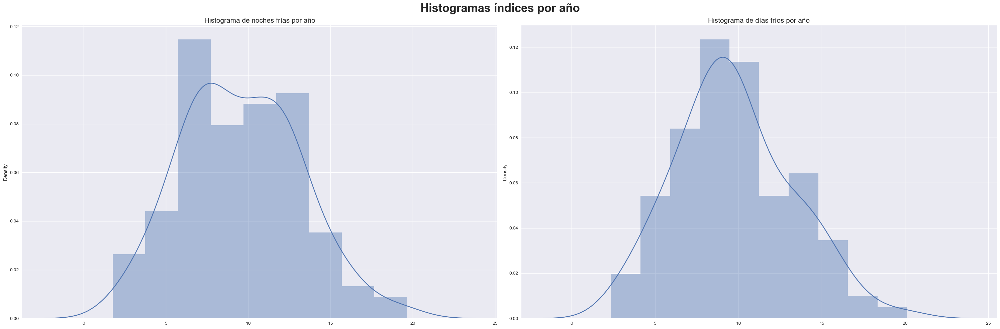

In [40]:
plt.style.use('seaborn')
fig = plt.figure(figsize=(30,10), tight_layout=True) 
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
sns.distplot(perc_cold_nights, ax=ax1)
sns.distplot(perc_cold_days, ax=ax2)
ax1.set_title('Histograma de noches frías por año',fontsize=15)
ax2.set_title('Histograma de días fríos por año',fontsize=15)
fig.suptitle('Histogramas índices por año',fontsize=25, weight='bold')
fig.savefig('Histograma de días y noches frías.png')

Vamos a hacer un análisis armónico de la señal (ajuste GEV).

In [83]:
#Una vez tenemos hechas las series temporales, que es lo que buscábamos, podemos calcular los periodos de retorno de la señal.
#Usaremos para ello las funciones definidas en el cuaderno de clase.

def nor(mu,sigma,x):
    #Nota: también podrías usar la función norm.pdf(x,k) del módulo stats del paquete scipy
    N=1/(sigma * np.sqrt(2 * np.pi)) * np.exp( - (x - mu)**2 / (2 * sigma**2))
    return N

def GEV(x,c):
    #Función que calcula la función densidad de probabilidad de Generalized Extrem Value normalizada
    # con m = 0, s = 1
    #nota: también puedes usar g=stats.genextreme.pdf(x,-c)
    if ( abs(c) < 0.005 ) :
        g = np.exp(-np.exp(-x))*np.exp(-x)
    else:
        g = ( np.power( 1 + c * x , -1-1/c) ) * np.exp( - np.power(1 + c * x ,-1/c) )
    return g

def GEVms(x,c,m,s):
    #Función que calcula la función de densidad de probabilidad Generalizada Extreme Value sin normalizar
    y = ( x - m ) / s
    if ( abs(c) < 0.005 ) :
        g = ( np.exp(-np.exp(-y))*np.exp(-y) ) / s
    else:
        g = ( np.power( 1 + c * y , -1-1/c) ) * np.exp( - np.power(1 + c * y ,-1/c) ) / s
    return g

def GPDs(y,c,s):
    #Función que calcula la función de densidad de probabilidad de Pareto Generalizada 
    if (abs(c)<0.0001):
        h = np.exp(-y/s)*(1/s)
    else:
        h = (1/s) * ( 1 + c * y / s) ** (-1-1/c)
    h[y<=0]=0
    return h

def MLE_GEV(c,m,s,x):
    #Función que calcula la función likelihood sobre GEV con 
    #los parámetros de entrada c,m,s
    #y la muestra de datos x
    if ( (s < 0) | np.any(1 + c * (x-m)/s ) < 0):
        sal=1e7
    else:            
        if (abs(c) > 0.00001 ):
            t = (1 + c * (x-m)/s )**(-1/c)
        else :
            t = np.exp(-(x-m)/s)
        f = - np.log(s) + (c +1)*np.log(t) -t
        sal = f.sum()
    return -sal


def returnLevel(p, c,m,s):
    if (abs(c) > 0.00001 ):
        zp = m - ( s / c ) * ( 1 - ( - np.log( 1 - p ) ) ** ( - c ))
    else :
        zp = m - s * np.log( - np.log( 1 - p ) )
    return zp


def densityPlotGEV(ax,x,c,m,s):
    n, bins, dummy = ax.hist(x,density=True,label='Empirica')
    x1, x2 = 2*bins[0] - bins[1], 2* bins[-1] - bins[-2]
    ax.set_xlim(x1,x2)
    x_x = np.linspace(x1,x2,200)
    y_y = GEVms(x_x,c,m,s)
    ax.plot(x_x,y_y,'r',label='Ajuste')
    ax.legend()
    ax.grid()
    ax.set_ylabel('probabilidad f(z)')
    ax.set_xlabel('z')
    return

def probabilityPlot(ax,pExp,pTeor):
    ax.plot([0,1],[0,1])
    ax.plot(pExp,pTeor,'o')
    ax.set_ylabel('Model')
    ax.set_xlabel('Empirical')
    ax.set_title('Probability plot',fontsize=25)
    ax.grid()
    return

def quantilePlot(ax,xTeor,xSort):
    xTeor = -xTeor
    xSort = -xSort
    ax.plot([xSort[0],xSort[-1]],[xSort[0],xSort[-1]])
    ax.plot(xTeor,xSort,'o')
    ax.set_ylabel('Model')
    ax.set_xlabel('Empirical')
    ax.set_title('Quantile plot',fontsize=25)
    ax.grid()
    return

def returnPlot(ax,p,zp,pExp,xSort):
    ax.semilogx(1/p,-zp)
    ax.grid()
    ax.set_xlim(1e-1,1e3)
    ax.semilogx(1/pExp,-xSort,'o')
    ax.set_title('Return level plot',fontsize=25)
    ax.set_xlabel('Return period (years)')
    ax.set_ylabel('Return level')
    return
    
def diagnosticsGEV(x,c,m,s):
    y = (x-m)/s
    ySort = np.sort(y)
    pExp = np.arange(1,ySort.size+1,1)/(ySort.size+1)
    pTeor = stats.genextreme.cdf(ySort,-c)
    xSort = np.sort(x)
    pExp = np.arange(1,xSort.size+1,1)/(xSort.size+1)
    pExpinv = np.arange(xSort.size+1,1,-1)/(xSort.size+1)
    xTeor = returnLevel(1-pExp, c,m,s)    
    p = np.logspace(-2, -1e-2, 100)
    zp=returnLevel(p,c,m,s)
    fig, ax = plt.subplots(2, 2, figsize=(14,10))
    probabilityPlot(ax[0,0],pExp,pTeor)
    quantilePlot(ax[0,1],xTeor,xSort)
    returnPlot(ax[1,0],p,zp,pExpinv,xSort)
    densityPlotGEV(ax[1,1],x,c,m,s)
    fig.suptitle('Diagnostics',weight='bold',fontsize=25)
    
    return 

def diagnosticsGPD(x,c,m,s,numYears,invert=False):
    fig, ax = plt.subplots(2, 2, figsize=(20,15))
    fig.suptitle('Diagnostics',weight='bold',fontsize=18)
    xSort = np.sort(x)
    pExp = np.arange(1,xSort.size+1,1)/(xSort.size+1)
    pExpinv = np.arange(xSort.size+1,1,-1)/(xSort.size+1)
    rv = stats.genpareto(c,m,s)
    pTeor = rv.cdf(xSort)
    xTeor = rv.ppf(pExp)
    fac = x.size / numYears
    p = np.logspace(-4, 2 , 100)
    zp = rv.ppf(1-p)
    fac = x.size / numYears
    returnPlot(ax[1,0],p*fac,zp,pExpinv*fac,xSort)
    probabilityPlot(ax[0,0],pExp,pTeor)
    quantilePlot(ax[0,1],xTeor,xSort)
    densityPlotGPD(ax[1,1],x,c,m,s)
    fig.tight_layout
    return (fig,ax)

def densityPlotGPD(ax,x,c,m,s):
    n, bins, dummy = ax.hist(-x,density=True,label='Empirica')
    x1, x2 = 2*bins[0] - bins[1], 2* bins[-1] - bins[-2]
    ax.set_xlim(x1,x2)
    x_x = np.linspace(x1,x2,200)
    y_y = stats.genpareto.pdf(-x_x,c,m,s)
    ax.plot(x_x,y_y,'r',linewidth = 4, label='Ajuste')
    ax.legend()
    ax.grid()
    ax.set_ylabel('probabilidad h(x)')
    ax.set_xlabel('x')
    ax.set_title('Density plot',fontsize=25)
    return

def runningMean(x,T):
    y = x.copy() * np.NaN
    N = x.size
    ini = int((T-1)/2)
    fin = int(T/2)
    for i in range(ini,N-fin):
        y[i] = np.mean(x[i-ini:i+fin+1])
    return y


def espectroArmonico(x,At):
    x = np.squeeze(np.array(x))
    N = x.size 
    xm = x.mean()
    Nmax = int(N/2) if (N % 2) == 0 else int((N-1)/2)
    jvec=np.arange(1,N+1)
    a = np.zeros(Nmax)
    b = np.zeros(Nmax)
    xa = x-xm
    fac = 2*np.pi*jvec/N
    for k in range(Nmax):
        a[k] = 2 / N * np.sum( np.matmul(xa,np.cos(fac*(k+1)) ))
        b[k] = 2 / N * np.sum( np.matmul(xa,np.sin(fac*(k+1)) ))
    if (N%2)==0: b[Nmax-1]=0
    kvec = np.arange(1,Nmax+1)
    # Habría que dividir entre 4, pero como sólo damos la parte positiva, para
    # que la suma de G nos aporte la varianza dividimos sólo entre 2
    G = ( a**2+b**2 ) / 2
    f = kvec/(N*At)
    return f,G

def espectroFFT(x,At):
    x = np.squeeze(np.array(x))
    N=x.size
    Nmax = int(N/2) if (N % 2) == 0 else int((N-1)/2)
    y = fft(x)
    ap = 2/N*np.real(y[1:Nmax+1])
    bp =  - 2/N*np.imag(y[1:Nmax+1])
    xm = np.mean(x)
    kvec = np.arange(1,Nmax+1)
    # Habría que dividir entre 4, pero como sólo damos la parte positiva, para
    # que la suma de G nos aporte la varianza dividimos sólo entre 2
    G = ( ap**2+bp**2 ) / 2
    f = kvec/(N*At)
    return f,G

def redSpectra(a,s2):
    f = np.arange(.0,.51,.01)
    N = f.size
    G = (s2*(1-a**2))/(1+a**2-2*a*np.cos(2*np.pi*f))
    #Hay que multiplicar por 2 porque sólo sacamos la parte positiva
    return f,2*G

def ajusteArmonico(x,numArm):
    x = np.squeeze(np.array(x))
    N = x.size 
    xm = x.mean()
    Nmax = int(N/2) if (N % 2) == 0 else int((N-1)/2)
    jvec=np.arange(1,N+1)
    a = np.zeros(Nmax)
    b = np.zeros(Nmax)
    xa = x-xm
    fac = 2*np.pi*jvec/N
    for k in range(Nmax):
        a[k] = 2 / N * np.sum( np.matmul(xa,np.cos(fac*(k+1)) ))
        b[k] = 2 / N * np.sum( np.matmul(xa,np.sin(fac*(k+1)) ))
    if (N%2)==0: b[Nmax-1]=0
    kvec = np.arange(1,Nmax+1)
    xhat = np.zeros(N)
    n = np.min([numArm,Nmax])
    for j in range(N):
        xhat[j] =  xm + np.sum( a[:n] * np.cos (2*np.pi*kvec[:n]*(j+1)/N) + b[:n] *
                               np.sin (2*np.pi*kvec[:n]*(j+1)/N) )
    return xhat,a,b

def ajusteArmonicoFFT(x,numArm):
    x = np.squeeze(np.array(x))
    N=x.size
    Nmax = int(N/2) if (N % 2) == 0 else int((N-1)/2)
    y = fft(x)
    ap = 2/N*np.real(y[1:Nmax+1])
    bp =  - 2/N*np.imag(y[1:Nmax+1])
    xm = np.mean(x)
    kvec = np.arange(1,Nmax+1)
    xhat = np.zeros(N)
    n = np.min([numArm+1,Nmax])
    for j in range(N):
        xhat[j] =  xm + np.sum( ap[:n] * np.cos (2*np.pi*kvec[:n]*(j)/N) + bp[:n] * 
                               np.sin (2*np.pi*kvec[:n]*(j)/N) )
    return xhat,ap,bp

def calculoAR1(x):
    xm = np.mean(x)
    N = x.size
    cor = stattools.acf(x, fft=False, nlags = 1) * N/(N-1)
    a = cor[1]
    sx = np.std(x, ddof=1)
    fac = np.sqrt((N-1)/(N-2)*(1-a**2))*sx
    AR1 = x * np.NaN
    rng = np.random.default_rng()
    Z = rng.normal(0,1,N)
    #También podéis generar el ruido blanco con stats de scipy
    #Z = stats.norm.rvs(size=N)
    AR1[0] = Z[0]
    for i in range(N-1):
        AR1[i+1] =  a * ( AR1[i] ) + fac * Z[i+1]
    return AR1 + xm


def calculoAutocov(x,nlag):
    cov = np.zeros([nlag+1])
    N = x.size
    xm = np.mean(x)
    ax = x-xm
    for t in range(nlag+1):
        cov[t] = np.sum(ax[:N-t]*ax[t:])/(N-1)
    return cov

# Noches frías

c=-0.278
m=14.376
s=2.343
u=14.376
100yr-return value=-18.314


"\nx = perc_cold_nights\nc, m, s = stats.genextreme.fit(x)\nc = - c\nprint('MLE ='+'%.3f'%(MLE_GEV(c,m,s,x)))\nprint('c='+'%.3f'%(c))\nprint('m='+'%.3f'%(m))\nprint('s='+'%.3f'%(s))\nprint('100 yr return value = '+'%.3f'%(returnLevel(0.01,c,m,s)))\ndiagnosticsGEV(x,c,m,s)"

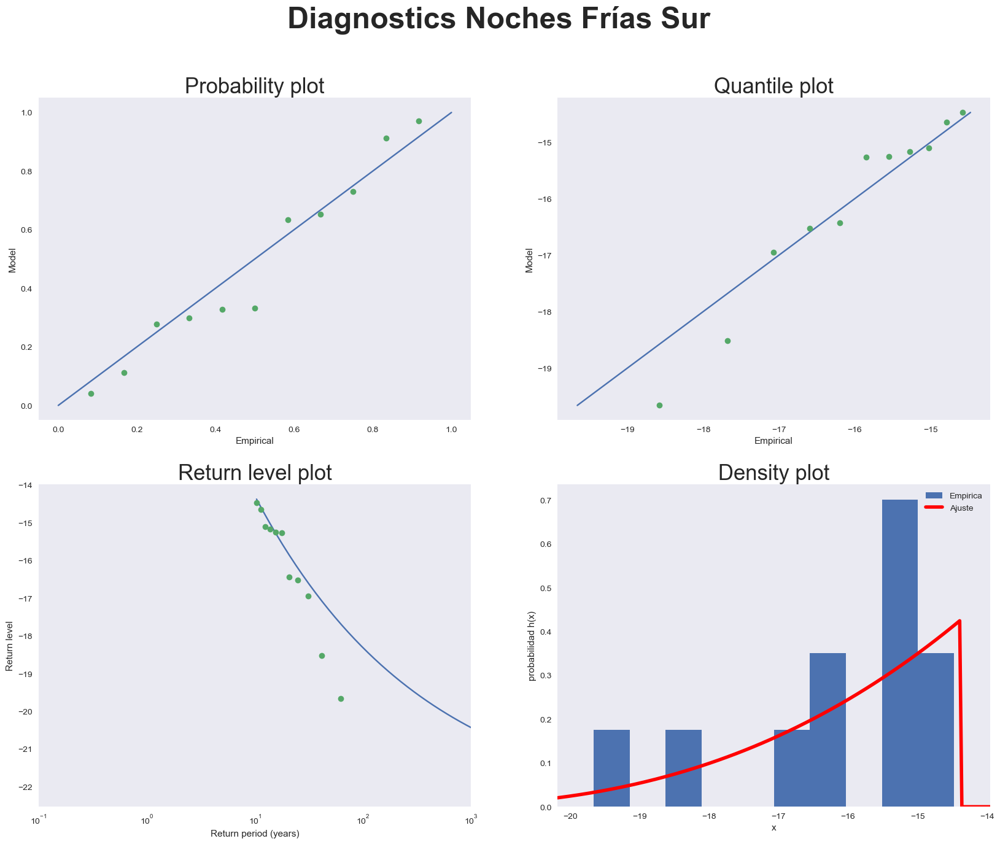

In [115]:
#Ajuste usando herramienta de scipy:
#Seleccion del umbral: cogeremos el percentil 10
x= perc_cold_nights.copy()
xSort = np.sort(x)
pExp = np.arange(1,xSort.size+1,1)/(xSort.size+1)
xLess= xSort[pExp<=.9]
u= xLess[-1] +.05
yExt = x[x>u].copy()  

#Ajuste usando herramienta de scipy:
c, m, s = stats.genpareto.fit(yExt,floc = u)

numYears=x.size
N = 100;
fac = yExt.size/numYears
rv = stats.genpareto(c,m,s)
zp = rv.ppf(1-1/N/fac)

#Diagnóstico:
fig,ax=diagnosticsGPD(yExt,c,m,s,numYears,True)
fig.suptitle('Diagnostics Noches Frías Sur',weight='bold',fontsize=35)
print('c='+'%.3f'%(c))
print('m='+'%.3f'%(m))
print('s='+'%.3f'%(s))
print('u='+'%.3f'%(u))
print('100yr-return value='+'%.3f'%(-zp))

'''
x = perc_cold_nights
c, m, s = stats.genextreme.fit(x)
c = - c
print('MLE ='+'%.3f'%(MLE_GEV(c,m,s,x)))
print('c='+'%.3f'%(c))
print('m='+'%.3f'%(m))
print('s='+'%.3f'%(s))
print('100 yr return value = '+'%.3f'%(returnLevel(0.01,c,m,s)))
diagnosticsGEV(x,c,m,s)'''

# Días Fríos

c=-0.143
m=14.790
s=1.915
u=14.790
100yr-return value=-18.366


"\nx = perc_cold_days\nc, m, s = stats.genextreme.fit(x)\nc = - c\nprint('MLE ='+'%.3f'%(MLE_GEV(c,m,s,x)))\nprint('c='+'%.3f'%(c))\nprint('m='+'%.3f'%(m))\nprint('s='+'%.3f'%(s))\nprint('100 yr return value = '+'%.3f'%(returnLevel(0.01,c,m,s)))\n\ndiagnosticsGEV(x,c,m,s)"

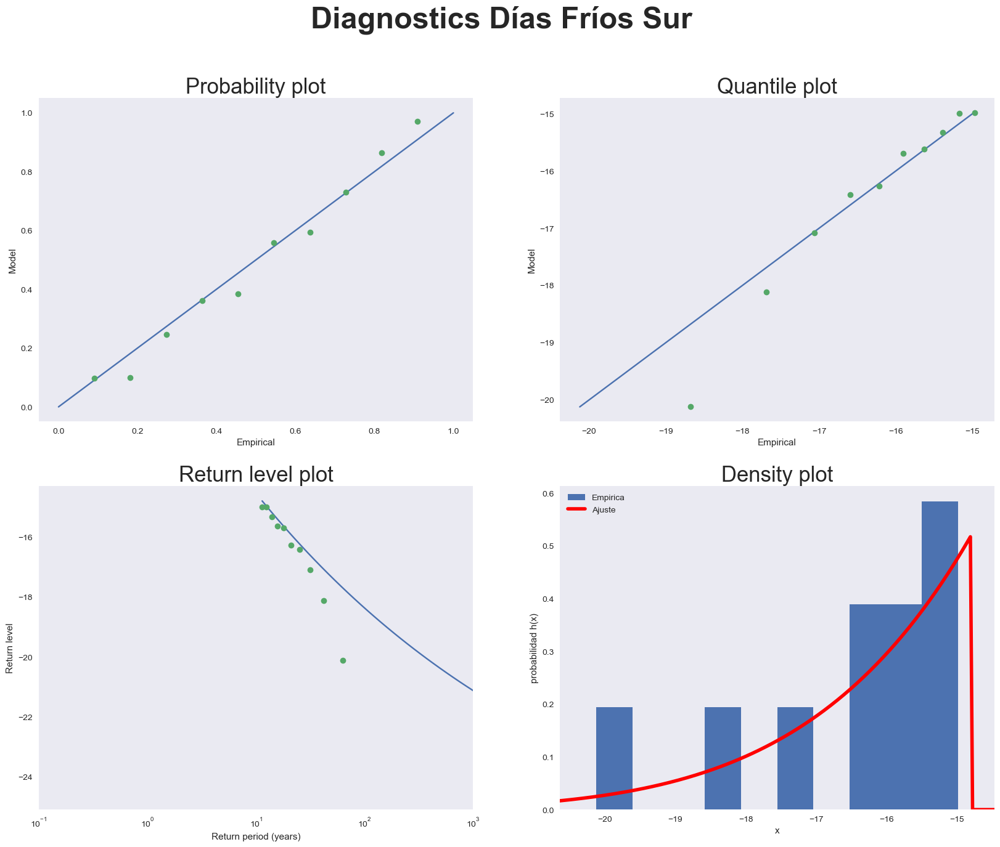

In [110]:
#Ajuste usando herramienta de scipy:
x= perc_cold_days.copy()
xSort = np.sort(x)
pExp = np.arange(1,xSort.size+1,1)/(xSort.size+1)
xLess= xSort[pExp<=.9]
u= xLess[-1] +.05
yExt = x[x>u].copy()  

#Ajuste usando herramienta de scipy:
c, m, s = stats.genpareto.fit(yExt,floc = u)

numYears=x.size
N = 100;
fac = yExt.size/numYears
rv = stats.genpareto(c,m,s)
zp = rv.ppf(1-1/N/fac)

#Diagnóstico:
fig,ax=diagnosticsGPD(yExt,c,m,s,numYears,True)
fig.suptitle('Diagnostics Días Fríos Sur',weight='bold',fontsize=35)
print('c='+'%.3f'%(c))
print('m='+'%.3f'%(m))
print('s='+'%.3f'%(s))
print('u='+'%.3f'%(u))
print('100yr-return value='+'%.3f'%(-zp))
'''
x = perc_cold_days
c, m, s = stats.genextreme.fit(x)
c = - c
print('MLE ='+'%.3f'%(MLE_GEV(c,m,s,x)))
print('c='+'%.3f'%(c))
print('m='+'%.3f'%(m))
print('s='+'%.3f'%(s))
print('100 yr return value = '+'%.3f'%(returnLevel(0.01,c,m,s)))

diagnosticsGEV(x,c,m,s)'''

# Periodogramas

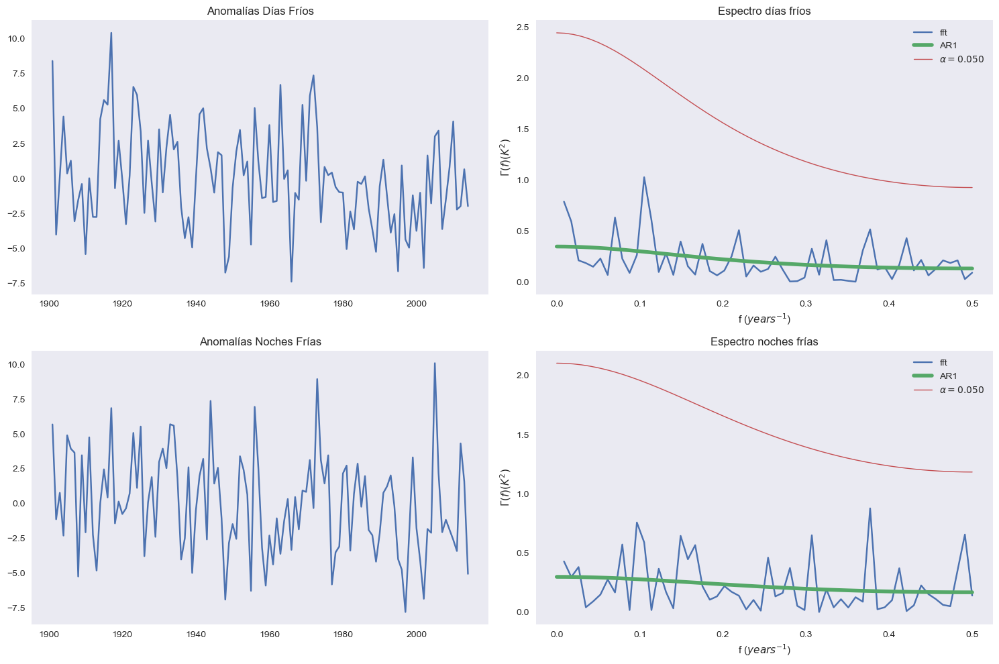

In [44]:
#Esta serie tiene mucha tendencia. Mejor quitarla para hacer la serie estacionaria:
#con la serie obtenida, has de calcular la media estacional y
#restarle la climatología (media de la serie para todo el periodo)
#x = signal.detrend(np.squeeze(np.array(perc_cold_days)))
x_day= (np.squeeze(np.array(perc_cold_days)))-np.mean(np.squeeze(np.array(perc_cold_days)))
x_night= (np.squeeze(np.array(perc_cold_nights)))-np.mean(np.squeeze(np.array(perc_cold_nights)))

time= period
fig,((ax0,ax1),(ax2,ax3))=plt.subplots(2,2,figsize=(15,10),tight_layout=True)

ax0.plot(time,x_day)
ax0.grid()
ax0.set_title('Anomalías Días Fríos')

ax2.plot(time,x_night)
ax2.grid()
ax2.set_title('Anomalías Noches Frías')

fa_day,Ga_day = espectroArmonico(x_day,1)
ff_day,Gf_day = espectroFFT(x_day,1)
#ax1.plot(fa_day,Ga_day,linewidth=4)
ax1.plot(ff_day,Gf_day,label='fft')
ax1.grid()
ax1.set_ylabel(r'$\Gamma(f) (K^2)$')
ax1.set_xlabel(r'f ($years^{-1}$)')
ax1.set_title('Espectro días fríos')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]

fa_night,Ga_night = espectroArmonico(x_night,1)
ff_night,Gf_night = espectroFFT(x_night,1)
#ax3.plot(fa_night,Ga_night,linewidth=4)
ax3.plot(ff_night,Gf_night,label='fft')
ax3.grid()
ax3.set_ylabel(r'$\Gamma(f) (K^2)$')
ax3.set_xlabel(r'f ($years^{-1}$)')
ax3.set_title('Espectro noches frías')
[np.var(x_night),np.sum(Ga_night),np.sum(Gf_night)]

#Veamos si los picos sobresalen lo suficiente:
alpha_day = 0.05
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x_day)
N= x_day.size
cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax1.plot(f_day,G_day/x_day.size,linewidth=4,label='AR1')
Gmax_day = G_day/x_day.size/nu_day*chi2_day
ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax1.legend()

#Veamos si los picos sobresalen lo suficiente:
alpha_night = 0.05
alphaS_night = alpha_night / Gf_night.size
nu_night = 2
chi2_night = stats.chi2.ppf(1-alphaS_night,2)
s2_night = np.var(x_night)
N= x_night.size
cor_night = stattools.acf(x_night, fft=False, nlags = 1) * N/(N-1)
a_night = cor_night[1]
f_night,G_night = redSpectra(a_night,s2_night)
ax3.plot(f_night,G_night/x_night.size,linewidth=4,label='AR1')
Gmax_night = G_night/x_night.size/nu_night*chi2_night
ax3.plot(f_night,Gmax_night,linewidth=1,label=r'$\alpha = %.3f$'%alpha_night)
a_night,s2_night,chi2_night
ax3.legend()
fig.savefig('Periodogramas indices.png')

In [45]:
f_day,G_day = espectroArmonico(x_day,1)
f_night,G_night = espectroArmonico(x_night,1)

frec_pico_dias= f_day[np.where(G_day==np.max(G_day))[0]]
frec_pico_noches= f_night[np.where(G_night==np.max(G_night))[0]]

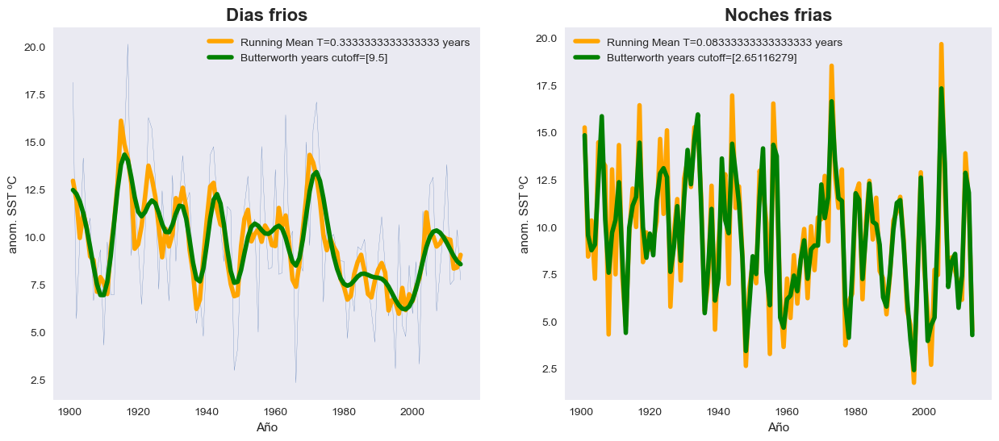

In [46]:
fig,(ax1,ax2) = plt.subplots(1,2,figsize=(15,6))

# La señal inicial
x = np.squeeze(np.array(perc_cold_days))
t = np.squeeze(np.array(period))
N = x.size
ax1.plot(t,x,linewidth=0.2)


#Voy a usar la condición mínima derivada en ambos extremos:
xtot = np.append(np.flip(x),[x,np.flip(x)])

# frecuencia de corte (en años) (pico en 0.11 años^-1):
nyc = 1/frec_pico_dias
Tc = nyc * 1
fc = 1 / Tc

#Media móvil: necesito una ventana de aprox. Tc/0.443
Window = int(0.433/fc)
#Window = Tc

#Filtro la señal ampliada y luego me quedo con el trozo central
ytot = runningMean(xtot,Window)
yRunningMean = ytot[N:2*N]


#Filtro de Butterworth, escogemos orden nominal 4
#Cuidado que el filtro de Butter tiene la frecuencia normalizada con 1 correspondiendo a fmax=FNyquist
n = 4
b,a = signal.butter(n,fc*2,output='ba')
#Filtro la señal ampliada y me quedo con la parte central:
ytot = signal.filtfilt(b,a,xtot)
yButter = ytot[N:2*N]


ax1.grid()
ax1.set_title('Dias frios',fontsize=16,weight='bold')
ax1.set_xlabel('Año')
ax1.set_ylabel('anom. SST ºC')
ax1.plot(t,yRunningMean,linewidth= 4,color='orange',label='Running Mean T='+str(Window/12)+' years')
ax1.plot(t,yButter,linewidth= 4,color='green',label='Butterworth years cutoff='+str(nyc))
ax1.legend()

# La señal inicial
x = np.squeeze(np.array(perc_cold_nights))
t = np.squeeze(np.array(period))
N = x.size
ax2.plot(t,x,linewidth=0.2)


#Voy a usar la condición mínima derivada en ambos extremos:
xtot = np.append(np.flip(x),[x,np.flip(x)])

# frecuencia de corte (en años) (pico en 0.37 años^-1):
nyc = 1/frec_pico_noches
Tc = nyc * 1
fc = 1 / Tc


#Media móvil: necesito una ventana de aprox. Tc/0.443
Window = int(0.433/fc)
#Window = Tc

#Filtro la señal ampliada y luego me quedo con el trozo central
ytot = runningMean(xtot,Window)
yRunningMean = ytot[N:2*N]


#Filtro de Butterworth, escogemos orden nominal 4
#Cuidado que el filtro de Butter tiene la frecuencia normalizada con 1 correspondiendo a fmax=FNyquist
n = 4
b,a = signal.butter(n,fc*2,output='ba')
#Filtro la señal ampliada y me quedo con la parte central:
ytot = signal.filtfilt(b,a,xtot)
yButter = ytot[N:2*N]


ax2.grid()
ax2.set_title('Noches frias',fontsize=16,weight='bold')
ax2.set_xlabel('Año')
ax2.set_ylabel('anom. SST ºC')
ax2.plot(t,yRunningMean,linewidth= 4,color='orange',label='Running Mean T='+str(Window/12)+' years')
ax2.plot(t,yButter,linewidth= 4,color='green',label='Butterworth years cutoff='+str(nyc))
ax2.legend()


Como hemos visto, al tomar el año entero como periodo, no obtenemos ninguna frecuencia significativa, con lo cual, no tenemos información suficiente como para después aplicar un filtro. Por ello, vamos a realizar el mismo estudio pero solo para los meses de invierno (Dic-Ene-Feb)

In [116]:
def periodo(max_data,min_data,season,periodo):
    max_data_red= max_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]), Time=(max_data.Time.dt.season == season))
    min_data_red= min_data.sel(lon=slice(lon_lims[0],lon_lims[1]),lat=slice(lat_lims[0],lat_lims[1]), Time=(min_data.Time.dt.season == season))

    max_data_red_percentil= max_data_red.sel(Time=slice('1961','1990'))
    min_data_red_percentil= min_data_red.sel(Time=slice('1961','1990'))
    
    alldata_min= min_data_red.tn
    alldata_max= max_data_red.tx

    cuantil_min= np.quantile(min_data_red_percentil.tn,0.1,axis=0)
    cuantil_max= np.quantile(max_data_red_percentil.tx,0.1,axis=0)

    n_cold_nights= np.zeros(114)
    n_cold_days= np.zeros(114)

    print('a')
    s=0
    for i in range(1901,2015):
        a= np.sum(np.where(alldata_min[alldata_min['Time.year']==i]<cuantil_min,1,0),axis=0)
        n_cold_nights[s]= np.nanmean(np.where(np.isnan(alldata_min[alldata_min['Time.year']==i]),np.nan,a))

        b= np.sum(np.where(alldata_max[alldata_max['Time.year']==i]<cuantil_max,1,0),axis=0)
        n_cold_days[s]= np.nanmean(np.where(np.isnan(alldata_max[alldata_max['Time.year']==i]),np.nan,b))

        #n_cold_nights[s]= np.mean(np.sum(np.where(alldata_min[alldata_min['Time.year']==i]<cuantil_min,1,0),axis=0))
        #n_cold_days[s]= np.mean(np.sum(np.where(alldata_max[alldata_max['Time.year']==i]<cuantil_max,1,0),axis=0))
        s+=1

    print('b')
    n_days_year= 365
    perc_cold_nights= (n_cold_nights/n_days_year)*100
    perc_cold_days= (n_cold_days/n_days_year)*100

    fig = plt.figure(figsize=(30,10), tight_layout=True) 
    ax1 = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)

    period= np.arange(1901,2015,1)

    ax1.plot(period,perc_cold_nights)
    ax2.plot(period,perc_cold_days)
    maximo_night= np.max(perc_cold_nights)
    minimo_night= np.min(perc_cold_nights)
    maximo_day= np.max(perc_cold_days)
    minimo_day= np.min(perc_cold_days)

    ax1.set_ylim(minimo_night,maximo_night)
    ax2.set_ylim(minimo_day,maximo_day)
    ax1.set_title('Porcentaje de noches frías',fontsize=15)
    ax2.set_title('Porcentaje de días fríos',fontsize=15)
    fig.suptitle('Porcentaje de noches y días fríos para todo en '+str(periodo)+' definiendo el percentil el periodo completo',fontsize=25, weight='bold')
    #fig.savefig('Porcentaje de noches y días fríos para todo el periodo de estudio definiendo el percentil el periodo completo.png')
    return fig, perc_cold_days, perc_cold_nights

In [135]:
def periodograma(perc_cold_days,perc_cold_nights,period,periodo,alfa):
    #x_day= signal.detrend(np.squeeze(np.array(perc_cold_days)))
    #x_night= signal.detrend(np.squeeze(np.array(perc_cold_nights)))
    x_day= (np.squeeze(np.array(perc_cold_days)))-np.mean(np.squeeze(np.array(perc_cold_days)))
    x_night= (np.squeeze(np.array(perc_cold_nights)))-np.mean(np.squeeze(np.array(perc_cold_nights)))

    time= period
    fig,((ax0,ax1),(ax2,ax3))=plt.subplots(2,2,figsize=(15,10),tight_layout=True)

    ax0.plot(time,x_day)
    ax0.grid()
    ax0.set_title('Anomalías Días Fríos')

    ax2.plot(time,x_night)
    ax2.grid()
    ax2.set_title('Anomalías Noches Frías')

    fa_day,Ga_day = espectroArmonico(x_day,1)
    ff_day,Gf_day = espectroFFT(x_day,1)
    frec_pico_dias= ff_day[np.where(Gf_day==np.max(Gf_day))[0]]
    #ax1.plot(fa_day,Ga_day,linewidth=4)
    ax1.plot(ff_day,Gf_day,label='fft')
    ax1.grid()
    ax1.set_ylabel(r'$\Gamma(f) (K^2)$')
    ax1.set_xlabel(r'f ($years^{-1}$)')
    ax1.set_title('Espectro días fríos')
    [np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]

    fa_night,Ga_night = espectroArmonico(x_night,1)
    ff_night,Gf_night = espectroFFT(x_night,1)
    frec_pico_noches= ff_night[np.where(Gf_night==np.max(Gf_night))[0]]
    #ax3.plot(fa_night,Ga_night,linewidth=4)
    ax3.plot(ff_night,Gf_night,label='fft')
    ax3.grid()
    ax3.set_ylabel(r'$\Gamma(f) (K^2)$')
    ax3.set_xlabel(r'f ($years^{-1}$)')
    ax3.set_title('Espectro noches frías')
    [np.var(x_night),np.sum(Ga_night),np.sum(Gf_night)]

    #Veamos si los picos sobresalen lo suficiente:
    alpha_day = alfa
    alphaS_day = alpha_day / Gf_day.size
    nu_day = 2
    chi2_day = stats.chi2.ppf(1-alphaS_day,2)
    s2_day = np.var(x_day)
    N= x_day.size
    cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
    a_day = cor_day[1]
    f_day,G_day = redSpectra(a_day,s2_day)
    ax1.plot(f_day,G_day/x_day.size,linewidth=4,label='AR1')
    Gmax_day = G_day/x_day.size/nu_day*chi2_day
    ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
    a_day,s2_day,chi2_day
    ax1.legend()

    #Veamos si los picos sobresalen lo suficiente:
    alpha_night = alfa
    alphaS_night = alpha_night / Gf_night.size
    nu_night = 2
    chi2_night = stats.chi2.ppf(1-alphaS_night,2)
    s2_night = np.var(x_night)
    N= x_night.size
    cor_night = stattools.acf(x_night, fft=False, nlags = 1) * N/(N-1)
    a_night = cor_night[1]
    f_night,G_night = redSpectra(a_night,s2_night)
    ax3.plot(f_night,G_night/x_night.size,linewidth=4,label='AR1')
    Gmax_night = G_night/x_night.size/nu_night*chi2_night
    ax3.plot(f_night,Gmax_night,linewidth=1,label=r'$\alpha = %.3f$'%alpha_night)
    a_night,s2_night,chi2_night
    ax3.legend()
    fig.suptitle('Periodogramas índices en '+str(periodo),fontsize=25, weight='bold')
    fig.savefig('Periodogramas_indices'+str(periodo)+'.png')
    return fig,frec_pico_dias,frec_pico_noches, Gf_day, ff_day

In [118]:
def filtros(perc_cold_days,perc_cold_nights,period,frec_pico_dias,frec_pico_noches,periodo):
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(15,6))

    # La señal inicial
    x = np.squeeze(np.array(perc_cold_days))
    t = np.squeeze(np.array(period))
    N = x.size
    ax1.plot(t,x,linewidth=0.2)


    #Voy a usar la condición mínima derivada en ambos extremos:
    xtot = np.append(np.flip(x),[x,np.flip(x)])

    # frecuencia de corte (en años) (pico en 0.11 años^-1):
    nyc = 1/frec_pico_dias
    Tc = nyc * 1
    fc = 1 / Tc

    #Media móvil: necesito una ventana de aprox. Tc/0.443
    Window = int(0.433/fc)
    #Window = Tc

    #Filtro la señal ampliada y luego me quedo con el trozo central
    ytot = runningMean(xtot,Window)
    yRunningMean_day = ytot[N:2*N]


    #Filtro de Butterworth, escogemos orden nominal 4
    #Cuidado que el filtro de Butter tiene la frecuencia normalizada con 1 correspondiendo a fmax=FNyquist
    n = 4
    b,a = signal.butter(n,fc*2,output='ba')
    #Filtro la señal ampliada y me quedo con la parte central:
    ytot = signal.filtfilt(b,a,xtot)
    yButter_day = ytot[N:2*N]


    ax1.grid()
    ax1.set_title('Dias frios en '+str(periodo),fontsize=16,weight='bold')
    ax1.set_xlabel('Año')
    ax1.set_ylabel('anom. SST ºC')
    ax1.plot(t,yRunningMean_day,linewidth= 4,color='orange',label='Running Mean T='+str(Window/12)+' years')
    ax1.plot(t,yButter_day,linewidth= 4,color='green',label='Butterworth years cutoff='+str(nyc))
    ax1.legend()

    # La señal inicial
    x = np.squeeze(np.array(perc_cold_nights))
    t = np.squeeze(np.array(period))
    N = x.size
    ax2.plot(t,x,linewidth=0.2)


    #Voy a usar la condición mínima derivada en ambos extremos:
    xtot = np.append(np.flip(x),[x,np.flip(x)])

    # frecuencia de corte (en años) (pico en 0.37 años^-1):
    nyc = 1/frec_pico_noches
    Tc = nyc * 1
    fc = 1 / Tc


    #Media móvil: necesito una ventana de aprox. Tc/0.443
    Window = int(0.433/fc)
    #Window = Tc

    #Filtro la señal ampliada y luego me quedo con el trozo central
    ytot = runningMean(xtot,Window)
    yRunningMean_night = ytot[N:2*N]


    #Filtro de Butterworth, escogemos orden nominal 4
    #Cuidado que el filtro de Butter tiene la frecuencia normalizada con 1 correspondiendo a fmax=FNyquist
    n = 4
    b,a = signal.butter(n,fc*2,output='ba')
    #Filtro la señal ampliada y me quedo con la parte central:
    ytot = signal.filtfilt(b,a,xtot)
    yButter_night = ytot[N:2*N]


    ax2.grid()
    ax2.set_title('Noches frias '+str(periodo),fontsize=16,weight='bold')
    ax2.set_xlabel('Año')
    ax2.set_ylabel('anom. porc de días')
    ax2.plot(t,yRunningMean_night,linewidth= 4,color='orange',label='Running Mean T='+str(Window/12)+' years')
    ax2.plot(t,yButter_night,linewidth= 4,color='green',label='Butterworth years cutoff='+str(nyc))
    ax2.legend()
    return fig, yRunningMean_day, yButter_day, yRunningMean_night, yButter_night

In [119]:
def refiltrado(perc_cold_days,perc_cold_nights,period,periodo,alfa):
    #x_day= signal.detrend(np.squeeze(np.array(perc_cold_days)))
    #x_night= signal.detrend(np.squeeze(np.array(perc_cold_nights)))
    x_day= perc_cold_days
    x_night= perc_cold_nights

    time= period
    fig,((ax0,ax1),(ax2,ax3))=plt.subplots(2,2,figsize=(15,10),tight_layout=True)

    ax0.plot(time,x_day)
    ax0.grid()
    ax0.set_title('Anomalías Días Fríos')

    ax2.plot(time,x_night)
    ax2.grid()
    ax2.set_title('Anomalías Noches Frías')

    fa_day,Ga_day = espectroArmonico(x_day,1)
    ff_day,Gf_day = espectroFFT(x_day,1)
    frec_pico_dias= ff_day[np.where(Gf_day==np.max(Gf_day))[0]]
    #ax1.plot(fa_day,Ga_day,linewidth=4)
    ax1.plot(ff_day,Gf_day,label='fft')
    ax1.grid()
    ax1.set_ylabel(r'$\Gamma(f) (K^2)$')
    ax1.set_xlabel(r'f ($years^{-1}$)')
    ax1.set_title('Espectro días fríos')
    [np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]

    fa_night,Ga_night = espectroArmonico(x_night,1)
    ff_night,Gf_night = espectroFFT(x_night,1)
    frec_pico_noches= ff_night[np.where(Gf_night==np.max(Gf_night))[0]]
    #ax3.plot(fa_night,Ga_night,linewidth=4)
    ax3.plot(ff_night,Gf_night,label='fft')
    ax3.grid()
    ax3.set_ylabel(r'$\Gamma(f) (K^2)$')
    ax3.set_xlabel(r'f ($years^{-1}$)')
    ax3.set_title('Espectro noches frías')
    [np.var(x_night),np.sum(Ga_night),np.sum(Gf_night)]

    #Veamos si los picos sobresalen lo suficiente:
    alpha_day = alfa
    alphaS_day = alpha_day / Gf_day.size
    nu_day = 2
    chi2_day = stats.chi2.ppf(1-alphaS_day,2)
    s2_day = np.var(x_day)
    N= x_day.size
    cor_day = stattools.acf(x_day, fft=False, nlags = 1) * N/(N-1)
    a_day = cor_day[1]
    f_day,G_day = redSpectra(a_day,s2_day)
    ax1.plot(f_day,G_day/x_day.size,linewidth=4,label='AR1')
    Gmax_day = G_day/x_day.size/nu_day*chi2_day
    ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
    a_day,s2_day,chi2_day
    ax1.set_ylim(0,0.3)
    ax1.legend()

    #Veamos si los picos sobresalen lo suficiente:
    alpha_night = alfa
    alphaS_night = alpha_night / Gf_night.size
    nu_night = 2
    chi2_night = stats.chi2.ppf(1-alphaS_night,2)
    s2_night = np.var(x_night)
    N= x_night.size
    cor_night = stattools.acf(x_night, fft=False, nlags = 1) * N/(N-1)
    a_night = cor_night[1]
    f_night,G_night = redSpectra(a_night,s2_night)
    ax3.plot(f_night,G_night/x_night.size,linewidth=4,label='AR1')
    Gmax_night = G_night/x_night.size/nu_night*chi2_night
    ax3.plot(f_night,Gmax_night,linewidth=1,label=r'$\alpha = %.3f$'%alpha_night)
    a_night,s2_night,chi2_night
    ax3.legend()
    ax3.set_ylim(0,0.3)
    fig.suptitle('Periodogramas refiltrado índices en '+str(periodo),fontsize=25, weight='bold')
    fig.savefig('Periodogramas_refiltrado_indices'+str(periodo)+'.png')
    return fig,frec_pico_dias,frec_pico_noches

a
b


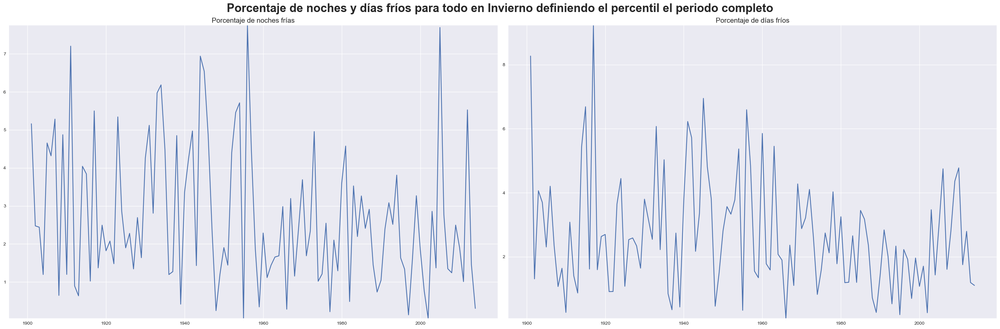

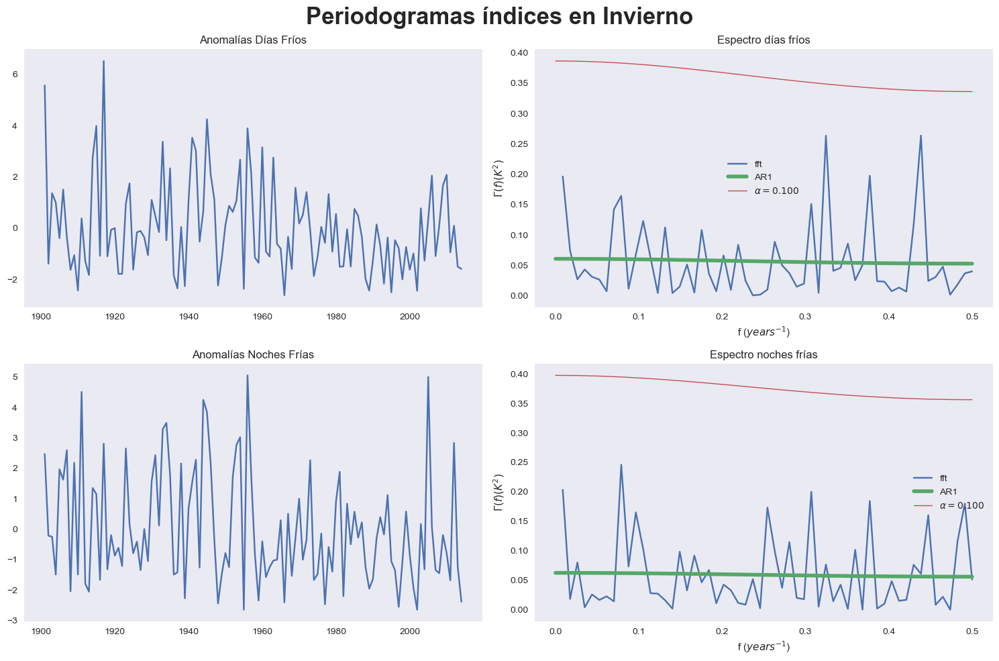

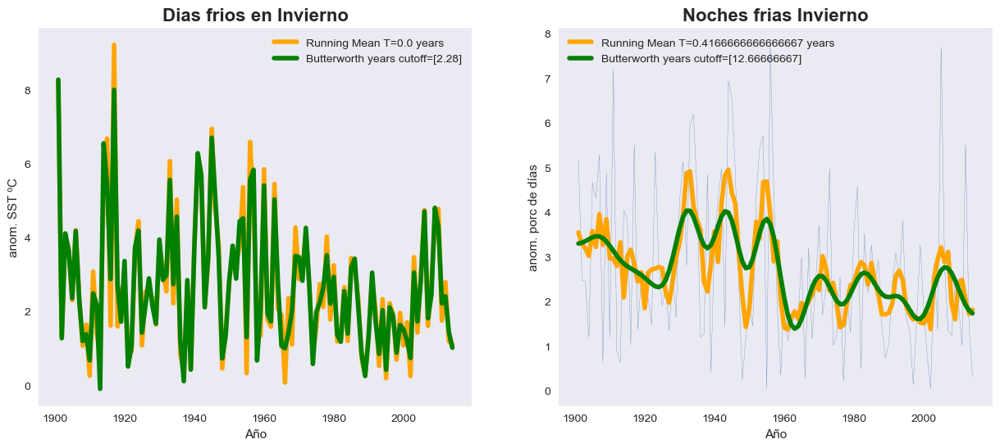

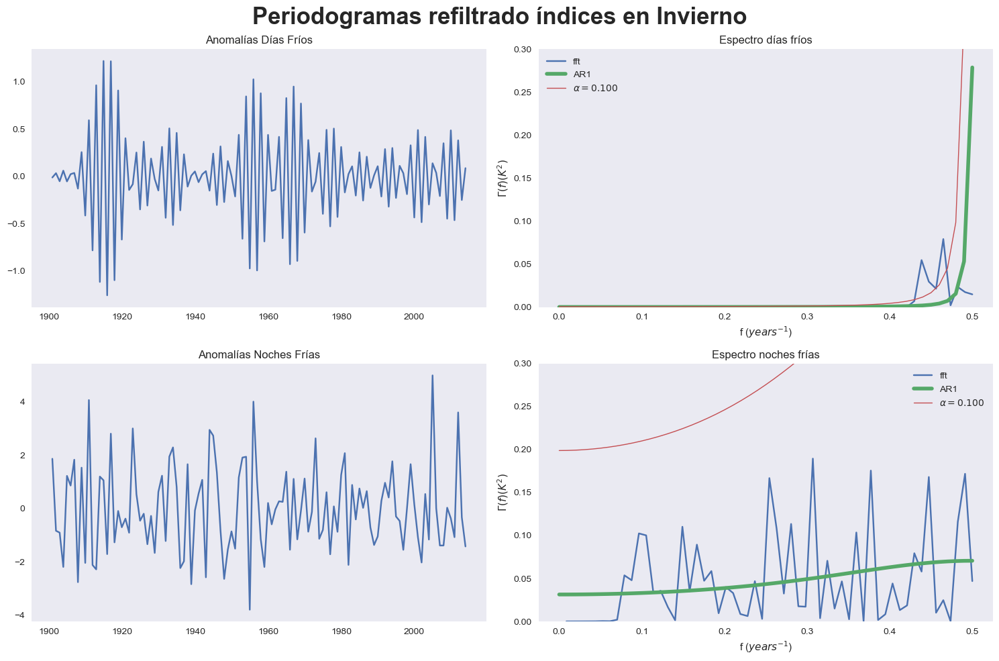

In [120]:
inv= periodo(max_data,min_data,season='DJF',periodo='Invierno')
inv_espectro= periodograma(inv[1],inv[2],period,periodo='Invierno',alfa=0.1)
inv_filtrado= filtros(inv[1],inv[2],period,inv_espectro[1],inv_espectro[2],periodo='Invierno')
inv_refiltrado= refiltrado(inv[1]-inv_filtrado[2],inv[2]-inv_filtrado[4],period,periodo='Invierno',alfa=0.1)

a
b


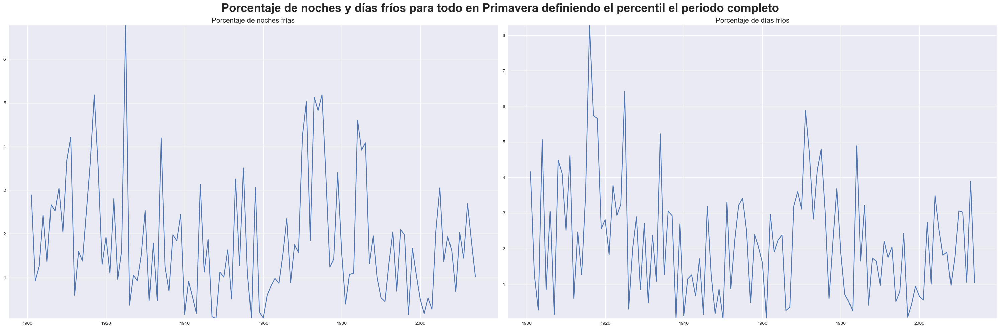

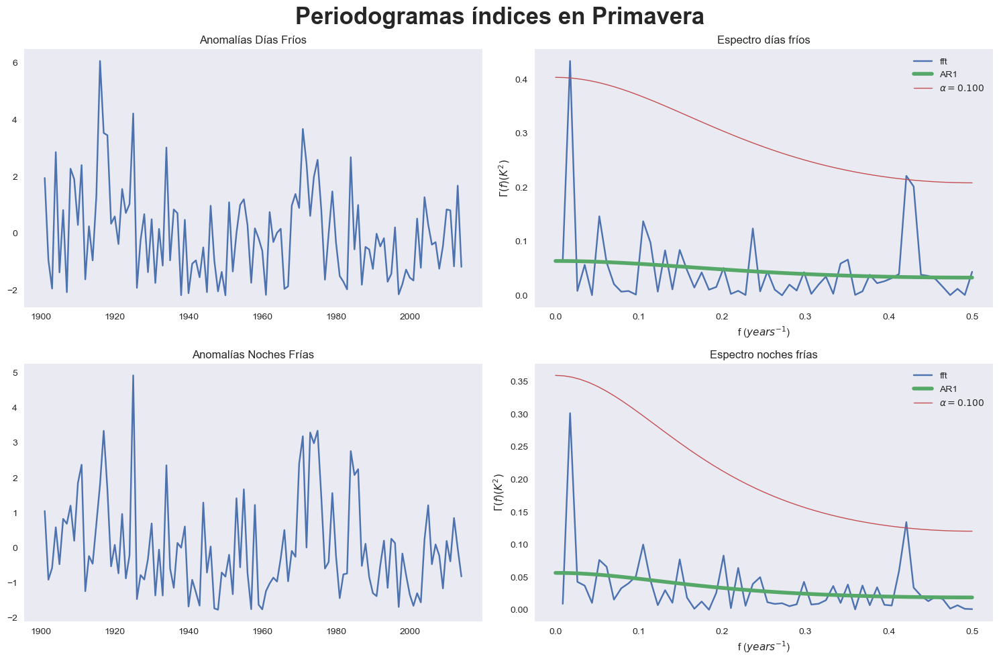

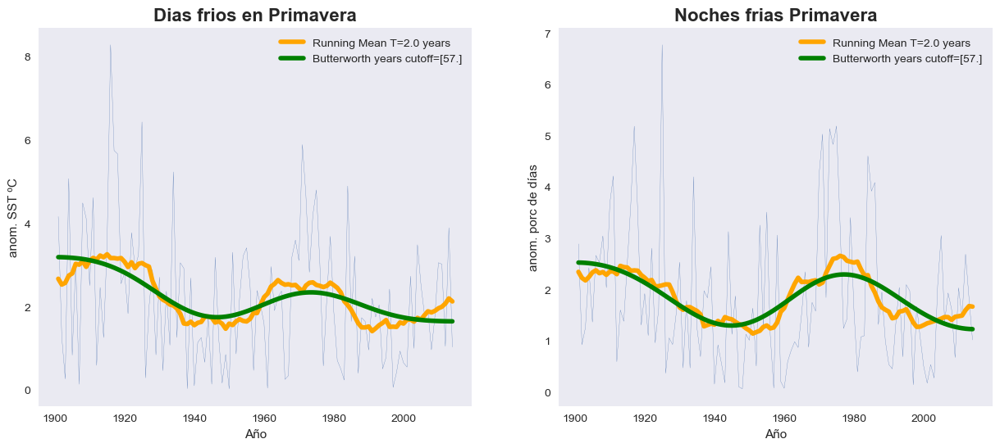

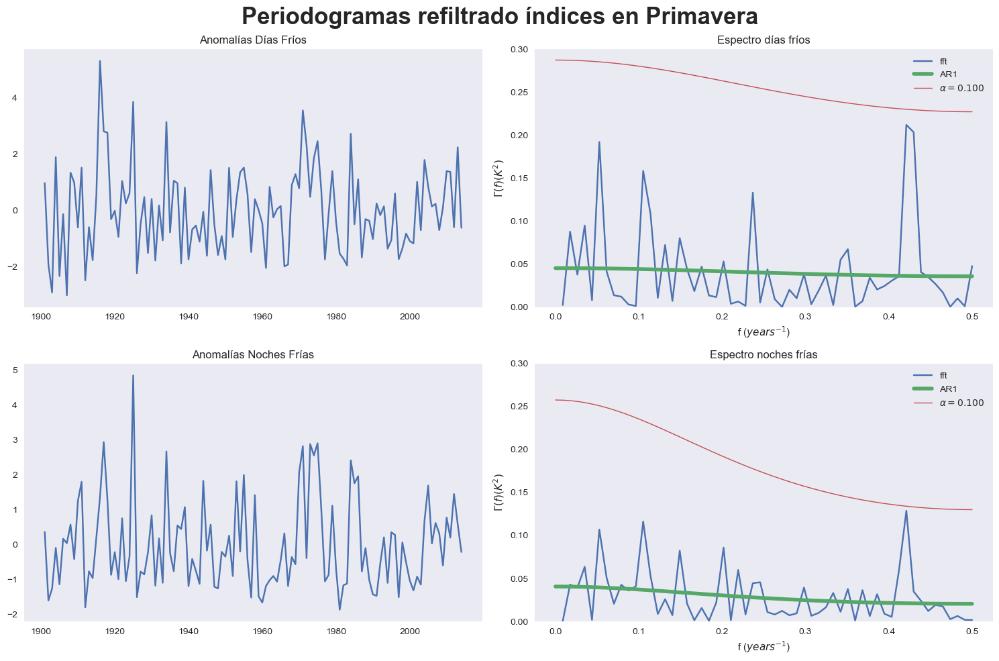

In [121]:
spr= periodo(max_data,min_data,season='MAM',periodo='Primavera')
spr_espectro= periodograma(spr[1],spr[2],period,periodo='Primavera',alfa=0.1)
spr_filtrado= filtros(spr[1],spr[2],period,spr_espectro[1],spr_espectro[2],periodo='Primavera')
spr_refiltrado= refiltrado(spr[1]-spr_filtrado[2],spr[2]-spr_filtrado[4],period,periodo='Primavera',alfa=0.1)

a
b


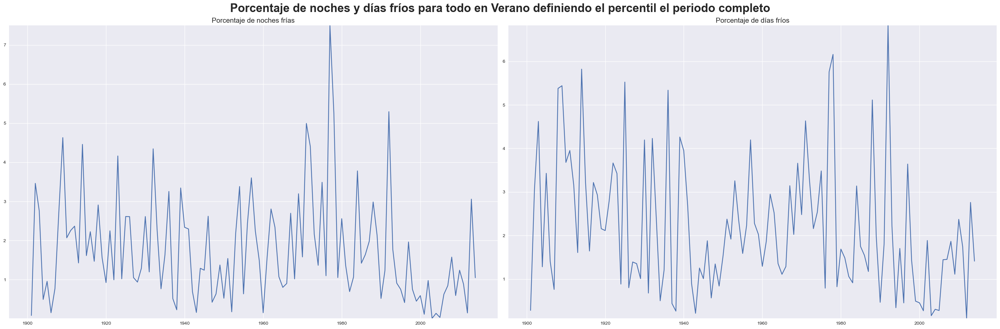

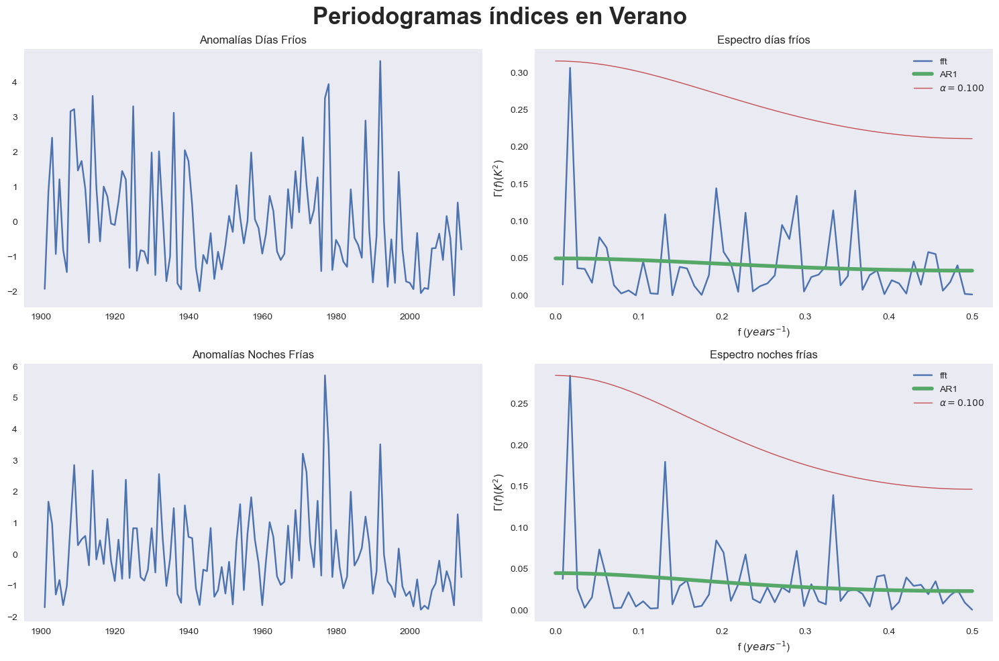

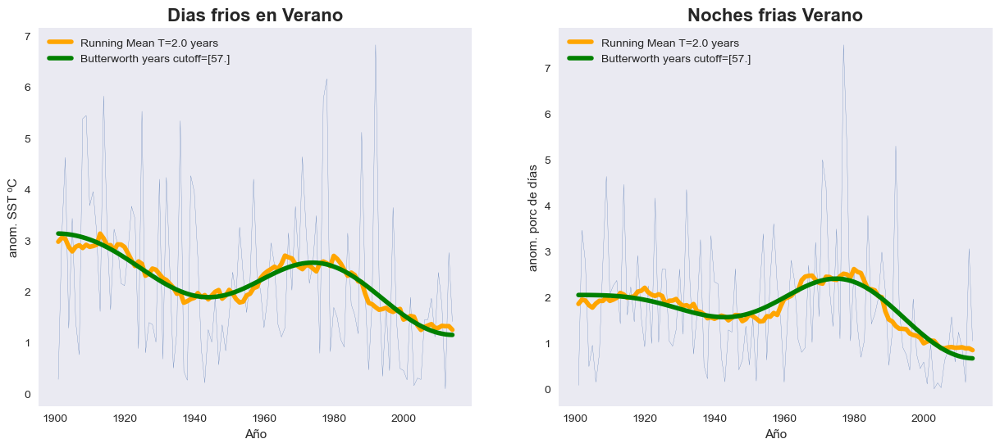

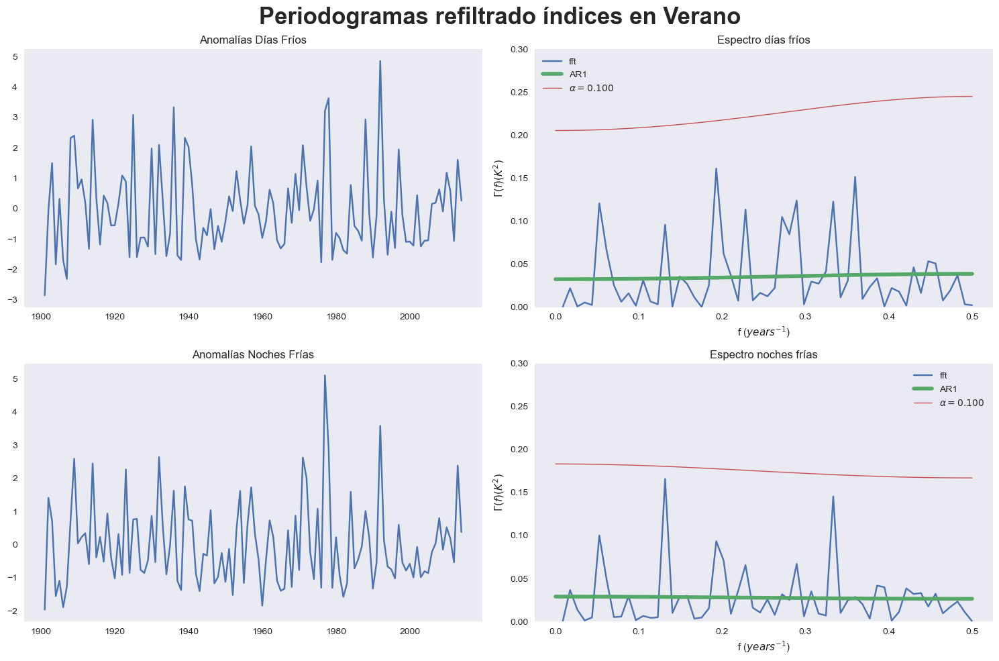

In [122]:
summer= periodo(max_data,min_data,season='JJA',periodo='Verano')
summer_espectro= periodograma(summer[1],summer[2],period,periodo='Verano',alfa=0.1)
summer_filtrado= filtros(summer[1],summer[2],period,summer_espectro[1],summer_espectro[2],periodo='Verano')
summer_refiltrado= refiltrado(summer[1]-summer_filtrado[2],summer[2]-summer_filtrado[4],period,periodo='Verano',alfa=0.1)

a
b


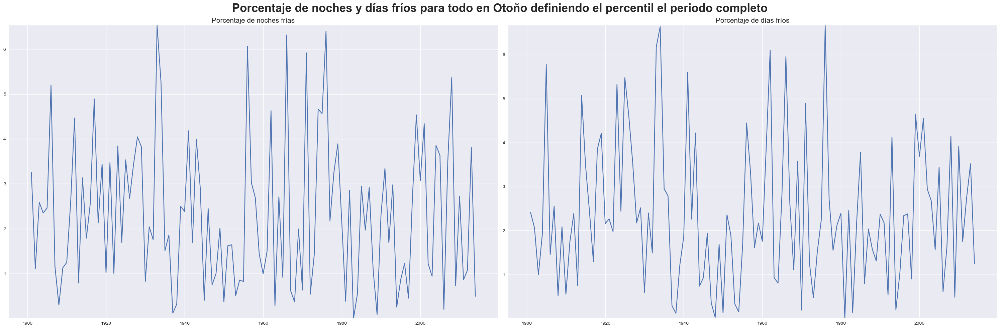

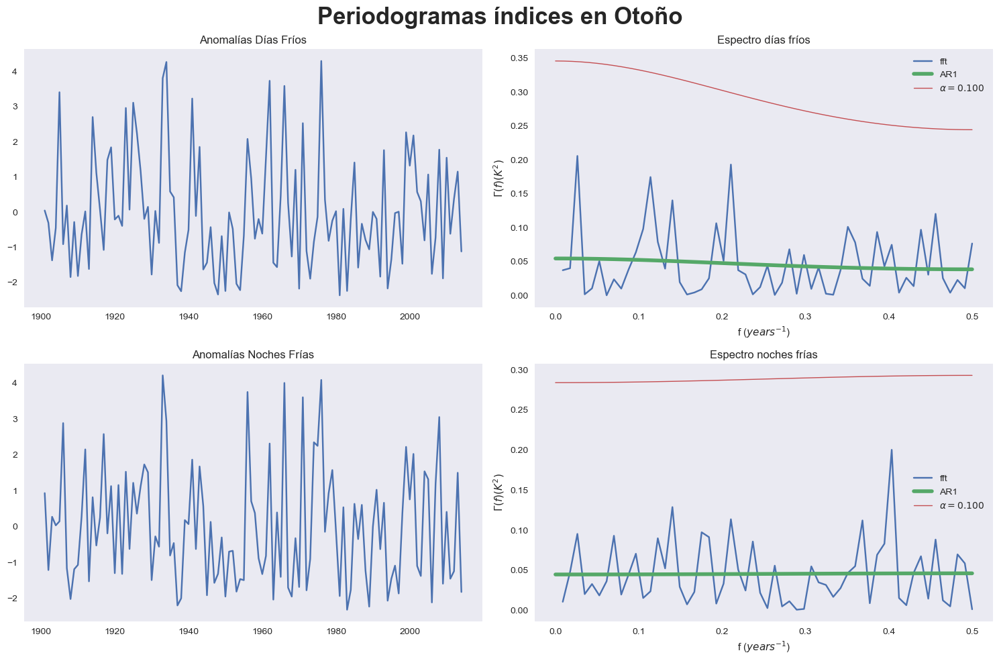

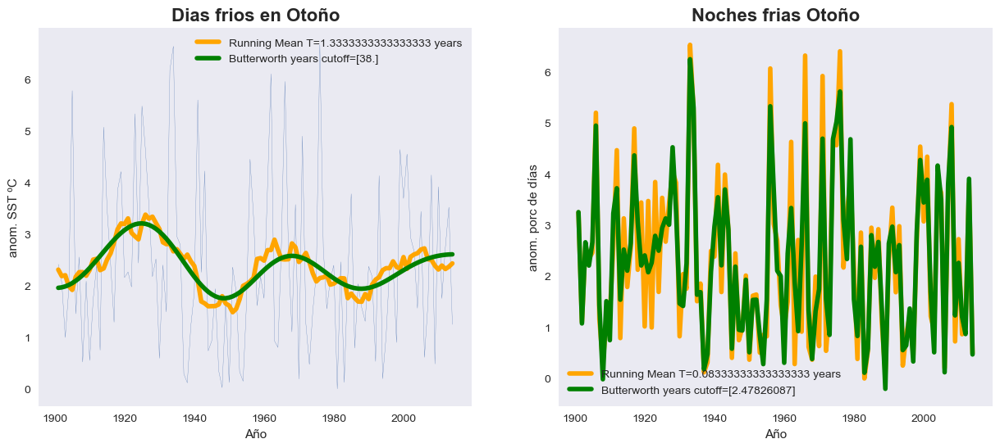

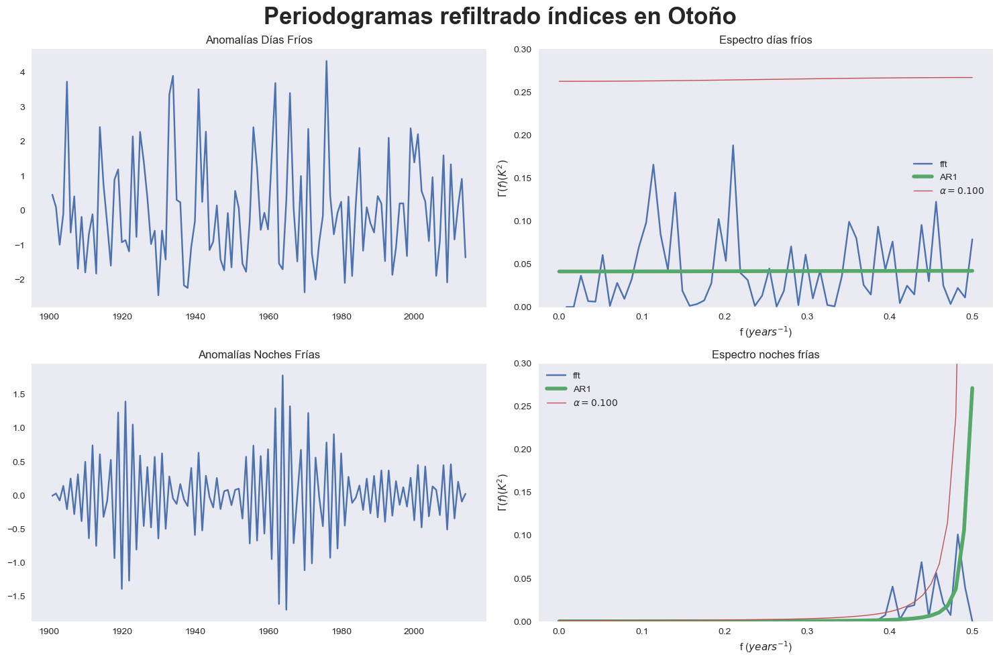

In [123]:
aut= periodo(max_data,min_data,season='SON',periodo='Otoño')
aut_espectro= periodograma(aut[1],aut[2],period,periodo='Otoño',alfa=0.1)
aut_filtrado= filtros(aut[1],aut[2],period,aut_espectro[1],aut_espectro[2],periodo='Otoño')
aut_refiltrado= refiltrado(aut[1]-aut_filtrado[2],aut[2]-aut_filtrado[4],period,periodo='Otoño',alfa=0.1)

Vamos a coger la señal de primavera para los días fríos y vamos a descomponer las dos principales frecuencias

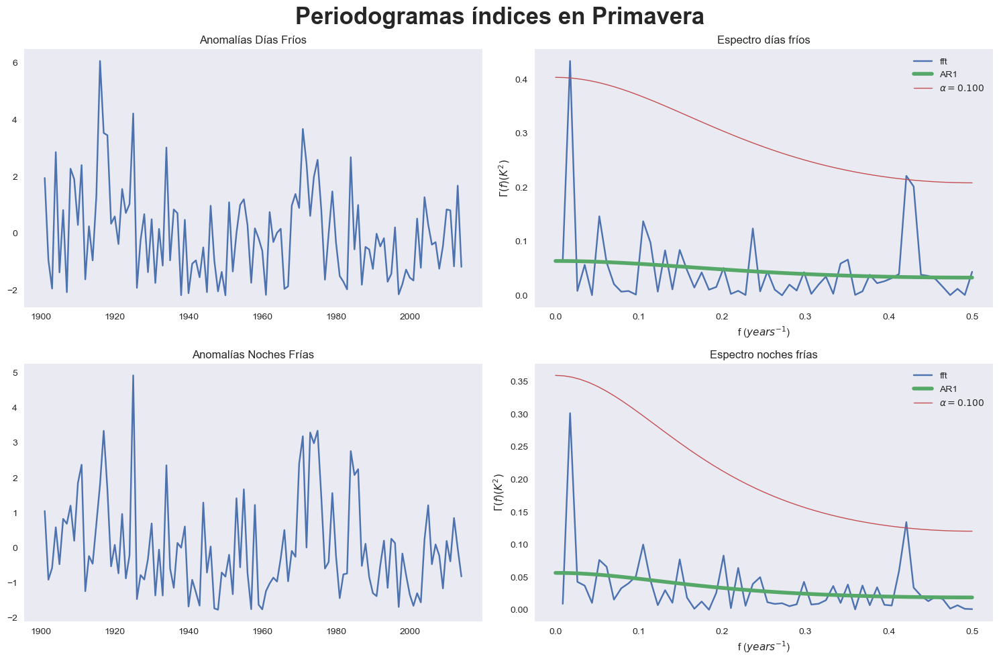

In [136]:
spr_espectro= periodograma(spr[1],spr[2],period,periodo='Primavera',alfa=0.1)
spectro_dias_spr= spr_espectro[3]
frec_dias_spr= spr_espectro[4]

In [141]:
spectro_sort= np.flip(np.sort(spectro_dias_spr))
frec_primera= frec_dias_spr[np.where(spectro_dias_spr==spectro_sort[0])[0]]
frec_segunda= frec_dias_spr[np.where(spectro_dias_spr==spectro_sort[1])[0]]

Ahora filtramos la señal, aplicamos un pasa-baja para la frec maxima, y un pasa-banda para la segunda frec

In [165]:
def doble_filtrado(señal,frec_pico1,frec_pico2):
    # La señal inicial
    x = np.squeeze(np.array(señal))
    N = x.size
    xtot = np.append(np.flip(x),[x,np.flip(x)])
    nyc = 1/frec_pico1
    Tc = nyc * 1
    fc = 1 / Tc
    Window = int(0.433/fc)
    ytot = runningMean(xtot,Window)
    yRunningMean_day = ytot[N:2*N]
    n = 4
    b,a = signal.butter(n,fc*2,output='ba',btype='highpass')
    ytot = signal.filtfilt(b,a,xtot)
    yButter_1 = ytot[N:2*N]

    x = np.squeeze(np.array(señal))
    N = x.size
    xtot = np.append(np.flip(x),[x,np.flip(x)])
    nyc = 1/frec_pico2
    Tc = nyc * 1
    fc = 1 / Tc
    Window = int(0.433/fc)
    ytot = runningMean(xtot,Window)
    yRunningMean_night = ytot[N:2*N]
    n = 4
    b,a = signal.butter(n,fc*2,output='ba',btype='highpass')
    ytot = signal.filtfilt(b,a,xtot)
    yButter_2 = ytot[N:2*N]
    return yButter_1, yButter_2

In [166]:
filtros= doble_filtrado(spr[1]-np.mean(spr[1]),frec_primera,frec_segunda)

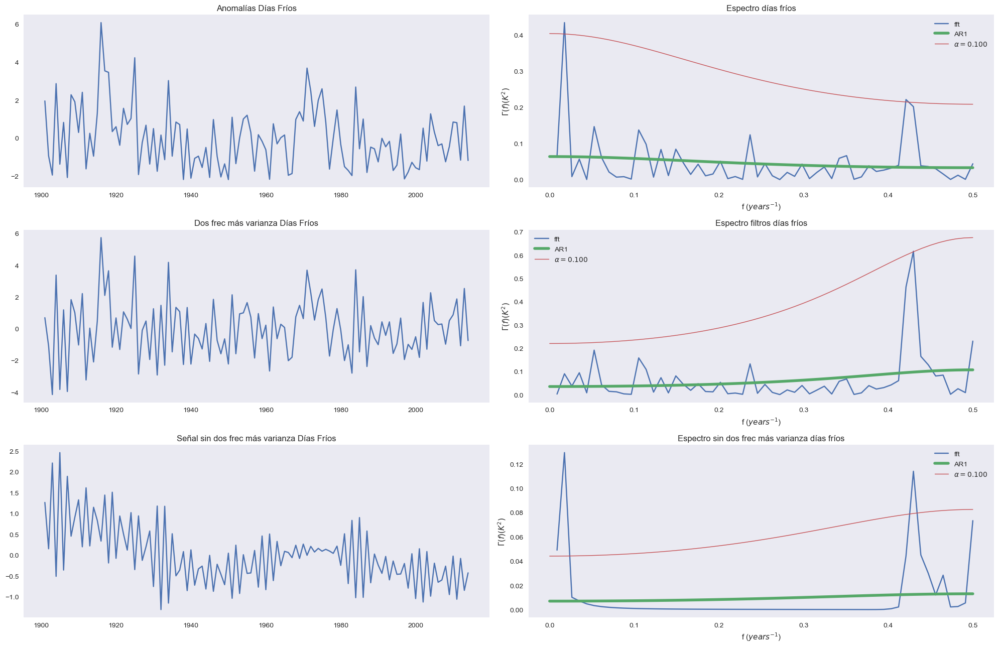

In [167]:
time= period
alfa=0.1
fig,((ax0,ax1),(ax2,ax3),(ax4,ax5))=plt.subplots(3,2,figsize=(20,13),tight_layout=True)

x= spr[1]-np.mean(spr[1])
ax0.plot(time,x)
ax0.grid()
ax0.set_title('Anomalías Días Fríos')

ff_day,Gf_day = espectroFFT(spr[1],1)
ax1.plot(ff_day,Gf_day,label='fft')
ax1.grid()
ax1.set_ylabel(r'$\Gamma(f) (K^2)$')
ax1.set_xlabel(r'f ($years^{-1}$)')
ax1.set_title('Espectro días fríos')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]

#Veamos si los picos sobresalen lo suficiente:
alpha_day = alfa
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x)
N= x.size
cor_day = stattools.acf(x, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax1.plot(f_day,G_day/x.size,linewidth=4,label='AR1')
Gmax_day = G_day/x.size/nu_day*chi2_day
ax1.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax1.legend()


ax2.plot(time,filtros[0]+filtros[1])
ax2.grid()
ax2.set_title('Dos frec más varianza Días Fríos')

ff_day,Gf_day = espectroFFT(filtros[0]+filtros[1],1)
ax3.plot(ff_day,Gf_day,label='fft')
ax3.grid()
ax3.set_ylabel(r'$\Gamma(f) (K^2)$')
ax3.set_xlabel(r'f ($years^{-1}$)')
ax3.set_title('Espectro filtros días fríos')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]

x= filtros[0]+filtros[1]
#Veamos si los picos sobresalen lo suficiente:
alpha_day = alfa
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x)
N= x.size
cor_day = stattools.acf(x, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax3.plot(f_day,G_day/x.size,linewidth=4,label='AR1')
Gmax_day = G_day/x.size/nu_day*chi2_day
ax3.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax3.legend()


ax4.plot(time,spr[1]-np.mean(spr[1])-(filtros[0]+filtros[1]))
ax4.grid()
ax4.set_title('Señal sin dos frec más varianza Días Fríos')



ff_day,Gf_day = espectroFFT(spr[1]-(filtros[0]+filtros[1]),1)
ax5.plot(ff_day,Gf_day,label='fft')
ax5.grid()
ax5.set_ylabel(r'$\Gamma(f) (K^2)$')
ax5.set_xlabel(r'f ($years^{-1}$)')
ax5.set_title('Espectro sin dos frec más varianza días fríos')
[np.var(x_day),np.sum(Ga_day),np.sum(Gf_day)]


x= spr[1]-(filtros[0]+filtros[1])
#Veamos si los picos sobresalen lo suficiente:
alpha_day = alfa
alphaS_day = alpha_day / Gf_day.size
nu_day = 2
chi2_day = stats.chi2.ppf(1-alphaS_day,2)
s2_day = np.var(x)
N= x.size
cor_day = stattools.acf(x, fft=False, nlags = 1) * N/(N-1)
a_day = cor_day[1]
f_day,G_day = redSpectra(a_day,s2_day)
ax5.plot(f_day,G_day/x.size,linewidth=4,label='AR1')
Gmax_day = G_day/x.size/nu_day*chi2_day
ax5.plot(f_day,Gmax_day,linewidth=1,label=r'$\alpha = %.3f$'%alpha_day)
a_day,s2_day,chi2_day
ax5.legend()


In [458]:
def varianza(dias,noches,periodo,ventana):
    data1= dias
    data2= noches
    periodo= period[ventana:-ventana]
    var_1= np.empty((data1.shape[0])-2*ventana)
    var_2= np.empty((data2.shape[0])-2*ventana)
    s=0
    for i in range(ventana,data.shape[0]-ventana):
        var_1[s]=np.var(data1[i-ventana:i+ventana])    
        var_2[s]=np.var(data2[i-ventana:i+ventana])
        s+=1
    return var_1,var_2,periodo

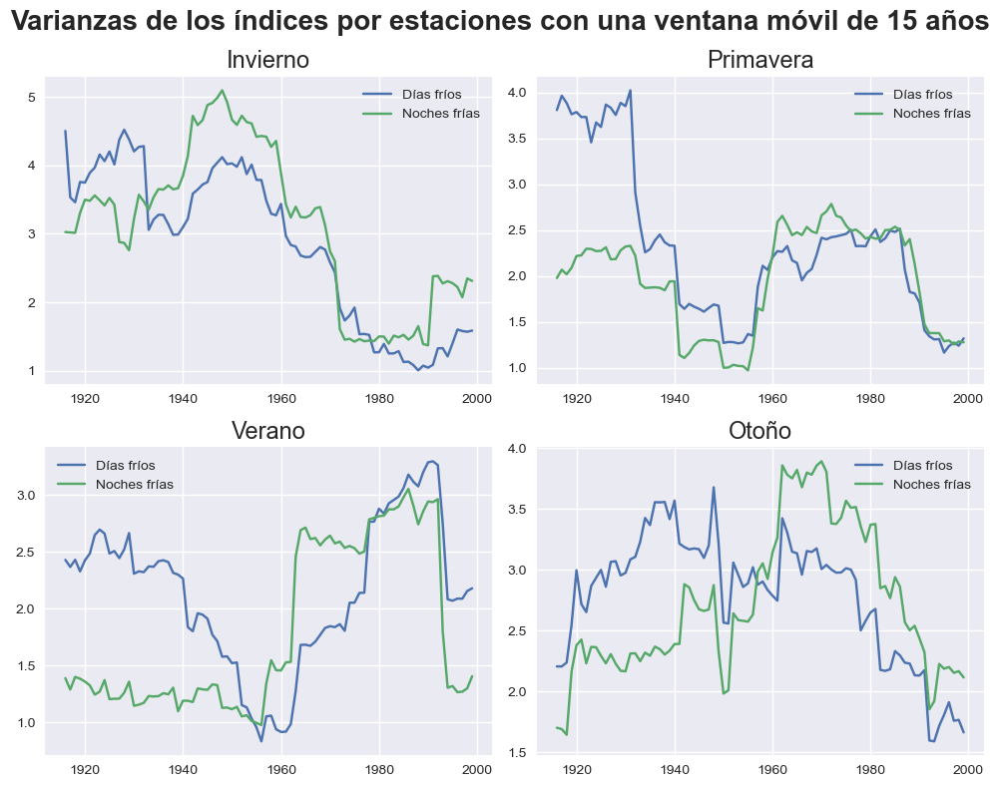

In [459]:
fig, ((ax1,ax2),(ax3,ax4))= plt.subplots(2,2,figsize=(10,8),tight_layout=True)

window=15
invierno= varianza(inv[1],inv[2],period,ventana=window)
ax1.plot(invierno[2],invierno[0],label='Días fríos')
ax1.plot(invierno[2],invierno[1],label='Noches frías')
ax1.set_title('Invierno',fontsize=17)
ax1.legend()

spring= varianza(spr[1],spr[2],period,ventana=window)
ax2.plot(spring[2],spring[0],label='Días fríos')
ax2.plot(spring[2],spring[1],label='Noches frías')
ax2.set_title('Primavera',fontsize=17)
ax2.legend()

summ= varianza(summer[1],summer[2],period,ventana=window)
ax3.plot(summ[2],summ[0],label='Días fríos')
ax3.plot(summ[2],summ[1],label='Noches frías')
ax3.set_title('Verano',fontsize=17)
ax3.legend()

autumn= varianza(aut[1],aut[2],period,ventana=window)
ax4.plot(autumn[2],autumn[0],label='Días fríos')
ax4.plot(autumn[2],autumn[1],label='Noches frías')
ax4.set_title('Otoño',fontsize=17)
ax4.legend()

fig.suptitle('Varianzas de los índices por estaciones con una ventana móvil de '+str(window)+' años',fontsize=20, weight='bold')
fig.savefig('Varianzas estaciones con ventana de '+str(window)+' años.png')